# Cobardía vs Altruismo — Experimentos con el motor de simulación `core`

Este cuaderno documenta una serie de experimentos computacionales diseñados para evaluar el impacto evolutivo de distintas estrategias de defensa ante la depredación. La implementación se basa íntegramente en el motor de simulación ubicado en `src/simulation/core/`, que modela un ecosistema discreto de agentes en el que herbívoros y depredadores interactúan generación a generación sobre un entorno de recursos limitados.

El objetivo central es determinar si rasgos cooperativos —tales como el altruismo puro, el altruismo selectivo con señal de barba verde o el camuflaje— confieren ventajas selectivas frente a estrategias individualistas, y bajo qué condiciones paramétricas se produce su fijación o extinción en la población.

A diferencia de una réplica analítica del estudio original, esta implementación incorpora depredadores explícitos como agentes, asignación de herbívoros por árbol según preferencias génicas y reproducción generacional controlada dentro del núcleo del simulador. Por ello, los resultados deben interpretarse como una adaptación metodológica del estudio, no como una réplica numérica exacta.

In [ ]:
import sys
import statistics
from pathlib import Path

ROOT = Path.cwd()
SRC = ROOT / "src"
if not SRC.exists():
    SRC = ROOT.parent / "src"
sys.path.insert(0, str(SRC))

try:
    get_ipython().run_line_magic("matplotlib", "inline")
except Exception:
    pass

from simulation.core import (
    SimulationConfig,
    CowardGene,
    AltruistGene,
    SelectiveAltruistGene,
    GreenBeardGene,
    GreenBeardAltruistGene,
    CamouflageHerbivoreGene,
    CamouflagePredatorGene,
    CautiousPredatorGene,
    SocialGreenBeardAltruistGene,
    SolitaryCowardGene,
    AmbushCamoGene,
)
from simulation.core.simulation import Experiment
from simulation.core.simulator import Simulator
from simulation.analysis.plotting import (
    plot_gene_distribution_single,
    plot_population_single,
    plot_aggregated_gene_distribution,
    plot_aggregated_population_stats,
    plot_aggregated_predator_gene_evolution,
    plot_aggregated_coevolution,
)
from simulation.analysis.runner import RandomPredatorGene, SimpleExperiment, run_multiple

In [2]:
# ── Genes compuestos definidos localmente ─────────────────────────────────────
from simulation.core.genes import Gene
from simulation.core.creature import Creature, Herbivore
from typing import Any, Dict, List, Tuple
import random as _random

class CamouflageCowardGene(Gene):
    """Fenotipo compuesto: cobarde + camuflado.

    Combina el comportamiento cobarde (el detector huye solo) con el rasgo
    físico de camuflaje (invisible para la selección de árbol del depredador
    y con 40 % de probabilidad de evasión durante la caza).

    Se usa como fenotipo único para evitar que 'coward' se cuente dos veces
    en los experimentos donde la población camuflada también tiene CowardGene.
    """

    name = "camouflage_coward"
    PRIORITY = 10

    def apply_physical_traits(self, creature: Creature) -> Dict[str, Any]:
        return {
            "hidden_from_predator": True,
            "hunt_evasion": 0.4,
        }

    def predator_behavior(
        self,
        notifier: Herbivore,
        assigned: List[Herbivore],
        cfg: Any,
        rng: _random.Random,
    ) -> Tuple[List[Herbivore], List[Herbivore]]:
        return [notifier], []

## Descripción del modelo de simulación

El simulador implementa un ecosistema de agentes discretos estructurado en torno a los siguientes elementos:

- **Herbívoros**: agentes que cada generación eligen un árbol para alimentarse, detectan (o no) la presencia de depredadores y responden según su gen de comportamiento principal: `CowardGene` (huye solo sin alertar al grupo), `AltruistGene` (alerta a todos a costa de un riesgo personal) o `GreenBeardAltruistGene` (altruismo selectivo dirigido a portadores de la misma señal).
- **Depredadores**: agentes que seleccionan un árbol objetivo y cazan a los herbívoros visibles que permanecen en él tras la fase de alarma.
- **Árboles**: recursos con capacidad fija por generación. Los herbívoros que no encuentran sitio libre mueren de inanición.

Cada generación se resuelve en cinco fases secuenciales:

1. **Asignación de herbívoros** — cada herbívoro elige un árbol disponible según sus genes de preferencia; el exceso muere de inanición.
2. **Selección de árbol objetivo por los depredadores** — los depredadores eligen árbol basándose únicamente en las presas *visibles* (los portadores de `CamouflageHerbivoreGene` quedan excluidos del mapa de presas).
3. **Interacción depredador–presa** — se resuelven detección, alarma y caza árbol por árbol.
4. **Reproducción** — los supervivientes generan descendencia con genoma idéntico y mueren; no existe mutación ni recombinación.
5. **Registro de estadísticas** — se construye un `DayReport` con frecuencias génicas, tamaño poblacional y causas de muerte.

Todos los experimentos utilizan `RandomPredatorGene` salvo indicación contraria, lo que introduce una presión de depredación no dirigida equivalente al modelo estocástico del estudio original.

## Experimento 1 — Cobardía pura (línea base)

**Hipótesis**: una población homogénea de individuos cobardes establece una dinámica de equilibrio determinada únicamente por la capacidad del entorno y la presión de depredación. Esta condición sirve como referencia para interpretar el impacto de estrategias cooperativas en los experimentos posteriores.

**Condición experimental**: el 100 % de los herbívoros porta `CowardGene`. Ante la detección de un depredador, el detector huye de inmediato sin alertar al resto del grupo. Los depredadores seleccionan árbol objetivo de forma aleatoria (`RandomPredatorGene`).

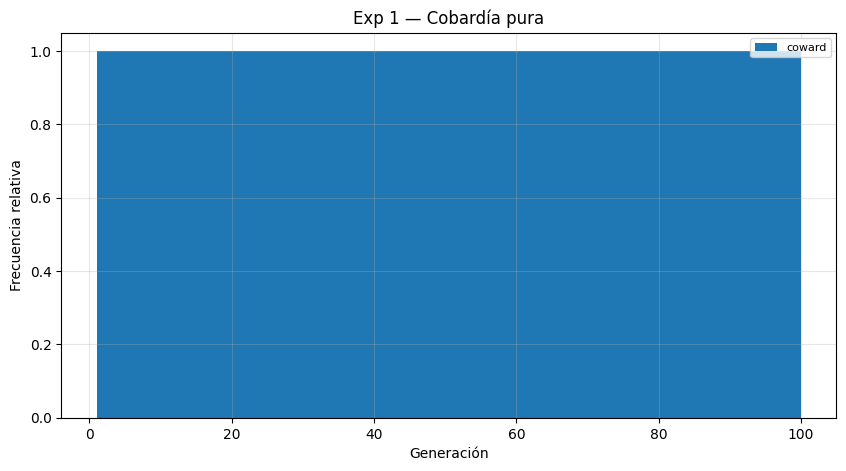

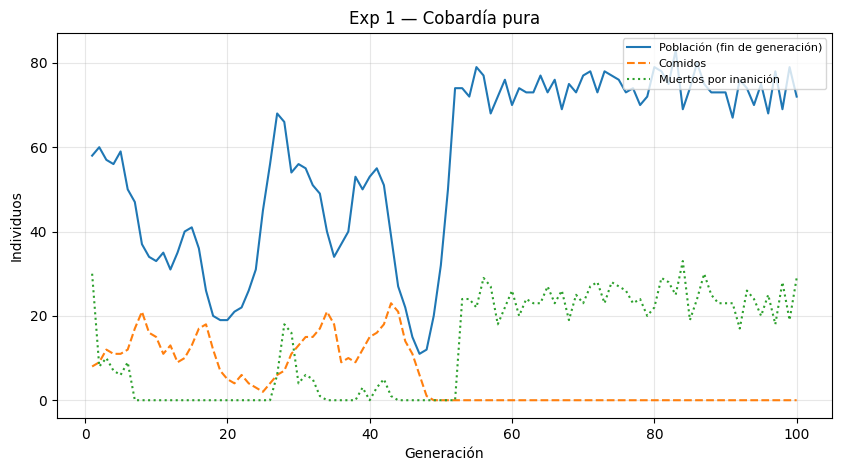

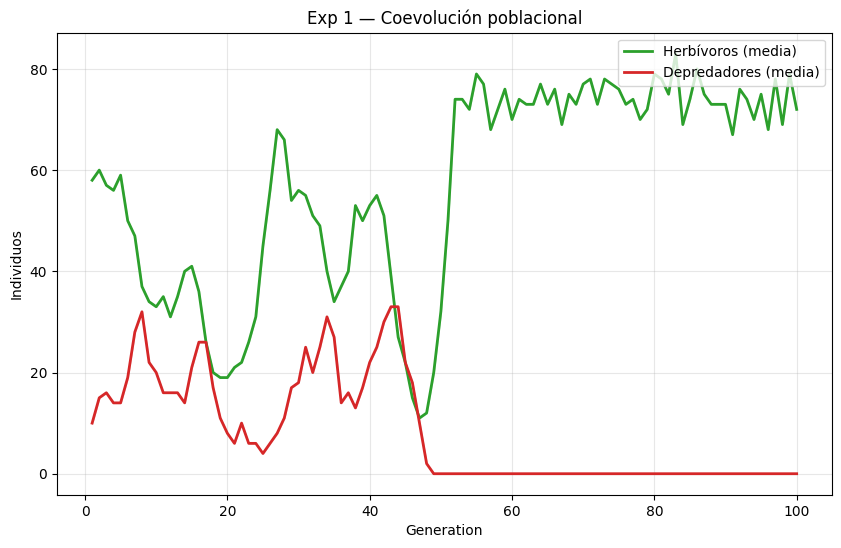

Generaciones simuladas : 100
Población inicial      : 80
Población final        : 72
Depredadores finales   : 0
Frecuencias génicas finales:
  coward: 1.000


In [3]:
# ── Configuración ─────────────────────────────────────────────────────────────
config_exp1 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=100,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=0.30,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=42,
)

# ── Definición de poblaciones ─────────────────────────────────────────────────
herbivore_specs_exp1 = [
    (lambda: [CowardGene()], 1.0),
]
predator_specs_random = [
    (lambda: [RandomPredatorGene()], 1.0),
]

# ── Objeto experimento ────────────────────────────────────────────────────────
exp1 = SimpleExperiment(
    name="Experimento 1 — Cobardía pura",
    description=(
        "Población de referencia compuesta íntegramente por individuos portadores de CowardGene. "
        "Establece la dinámica de equilibrio bajo una estrategia individualista sin cooperación."
    ),
    config=config_exp1,
    herbivore_specs=herbivore_specs_exp1,
    predator_specs=predator_specs_random,
)

# ── Ejecución ──────────────────────────────────────────────────────────────────
reports_exp1 = Simulator(exp1).run()

# ── Visualización ──────────────────────────────────────────────────────────────
plot_gene_distribution_single(reports_exp1, title="Exp 1 — Cobardía pura", show=True)
plot_population_single(reports_exp1, title="Exp 1 — Cobardía pura", show=True)
plot_aggregated_coevolution([reports_exp1], title="Exp 1 — Coevolución poblacional", show=True)

# ── Estadísticas resumen ───────────────────────────────────────────────────────
print(f"Generaciones simuladas : {len(reports_exp1)}")
print(f"Población inicial      : {reports_exp1[0].population_start}")
print(f"Población final        : {reports_exp1[-1].population_end}")
print(f"Depredadores finales   : {reports_exp1[-1].predator_count_end}")
print("Frecuencias génicas finales:")
for gene, freq in sorted(reports_exp1[-1].gene_frequencies.items()):
    print(f"  {gene}: {freq:.3f}")

## Experimento 2 — Cobardía vs Altruismo puro

**Hipótesis**: el altruista, al alertar al grupo entero a costa de un riesgo personal, debería aumentar la supervivencia colectiva. Sin embargo, cuando la probabilidad de escape del altruista (`altruist_escape_prob`) es baja, el coste individual puede superar el beneficio para el grupo, favoreciendo la expansión del comportamiento cobarde.

**Condición experimental**: la población inicial se divide a partes iguales entre `CowardGene` (50 %) y `AltruistGene` (50 %). Se estudian dos valores de `altruist_escape_prob` (p = 0.50 y p = 0.90) en corridas individuales, y se valida la condición más favorable mediante 30 corridas independientes con distintas semillas.

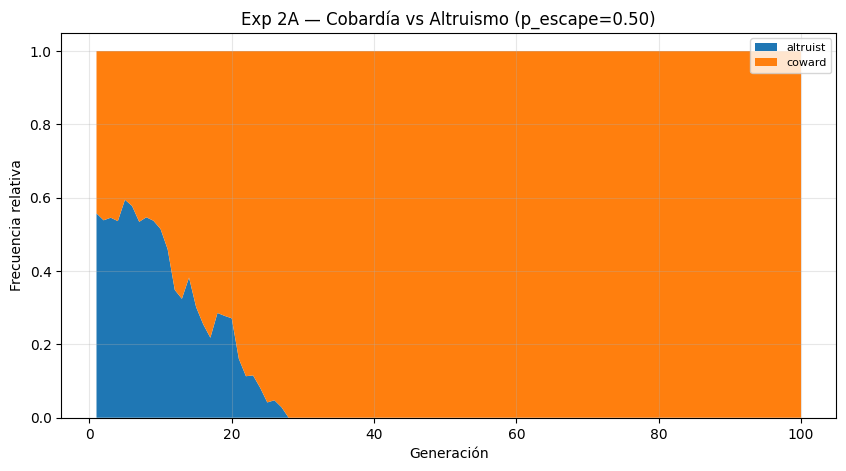

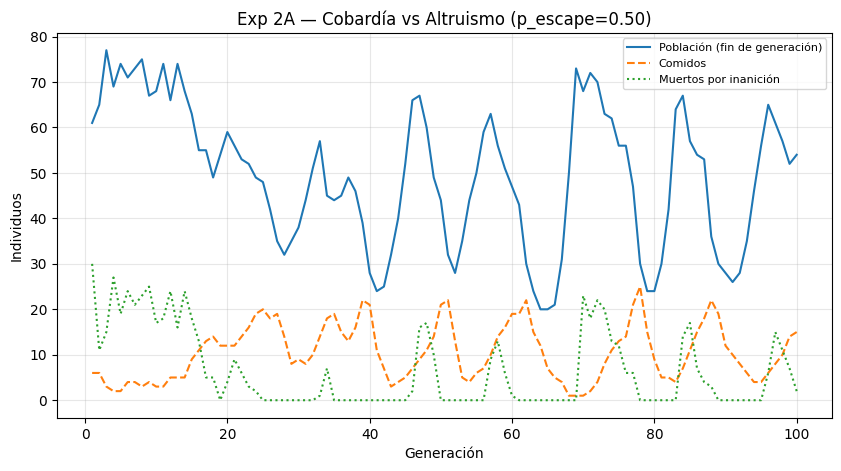

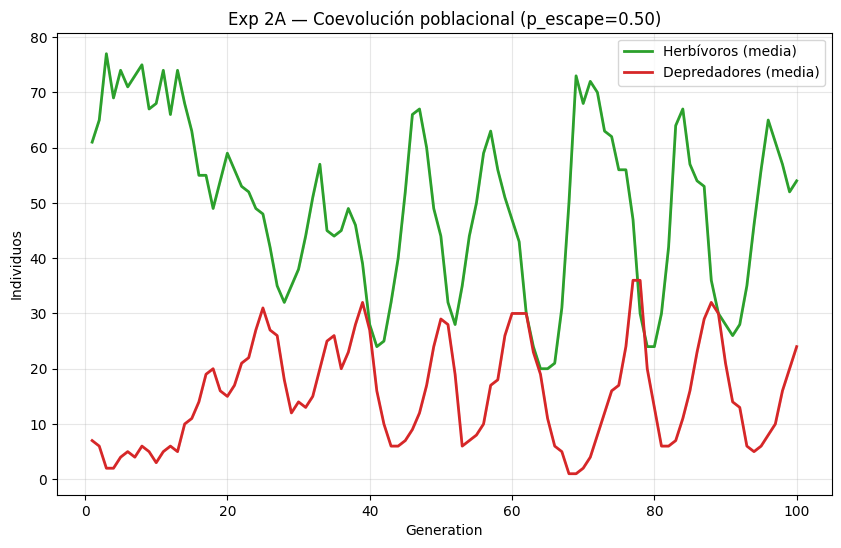

Frecuencias génicas finales:
  coward: 1.000
Depredadores finales: 24


In [4]:
# ── Condición 2A: altruist_escape_prob = 0.50, corrida única ──────────────────
config_exp2a = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=100,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=0.30,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=42,
)

herbivore_specs_exp2 = [
    (lambda: [CowardGene()],   0.50),
    (lambda: [AltruistGene()], 0.50),
]

exp2a = SimpleExperiment(
    name="Experimento 2A — Cobardía vs Altruismo (p_escape=0.50)",
    description="50 % CowardGene / 50 % AltruistGene; probabilidad de escape del altruista = 0.50.",
    config=config_exp2a,
    herbivore_specs=herbivore_specs_exp2,
    predator_specs=predator_specs_random,
)

reports_exp2a = Simulator(exp2a).run()

plot_gene_distribution_single(
    reports_exp2a, title="Exp 2A — Cobardía vs Altruismo (p_escape=0.50)", show=True
)
plot_population_single(
    reports_exp2a, title="Exp 2A — Cobardía vs Altruismo (p_escape=0.50)", show=True
)
plot_aggregated_coevolution(
    [reports_exp2a],
    title="Exp 2A — Coevolución poblacional (p_escape=0.50)",
    show=True,
)

print("Frecuencias génicas finales:")
for gene, freq in sorted(reports_exp2a[-1].gene_frequencies.items()):
    print(f"  {gene}: {freq:.3f}")
print(f"Depredadores finales: {reports_exp2a[-1].predator_count_end}")

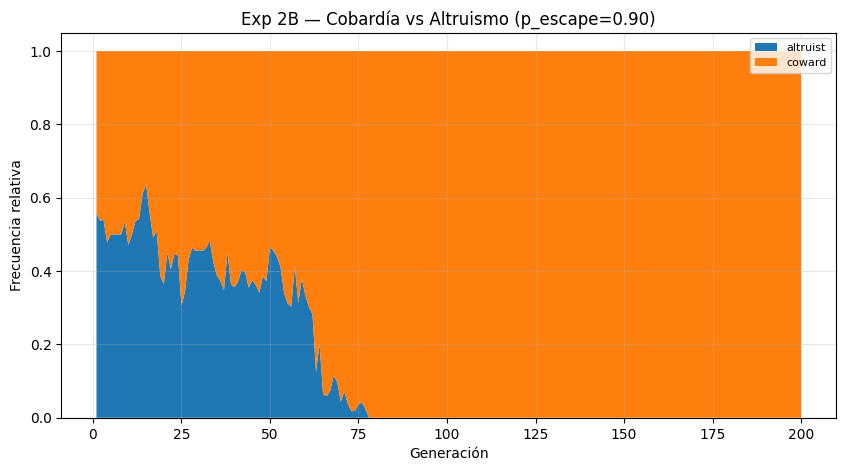

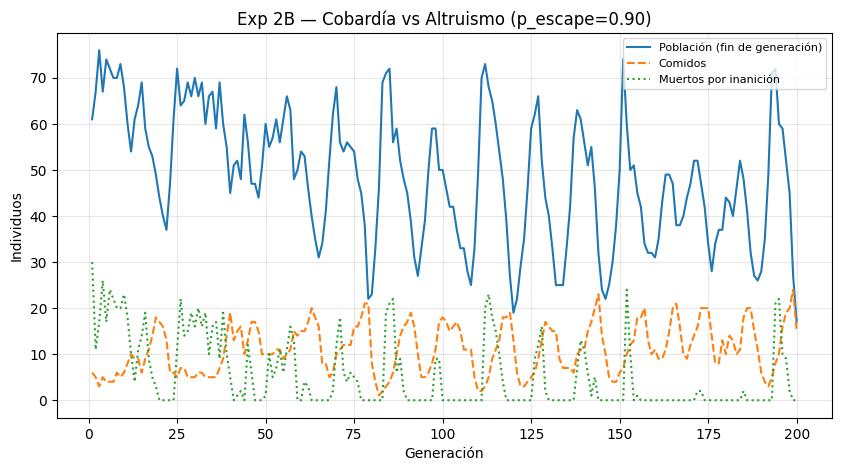

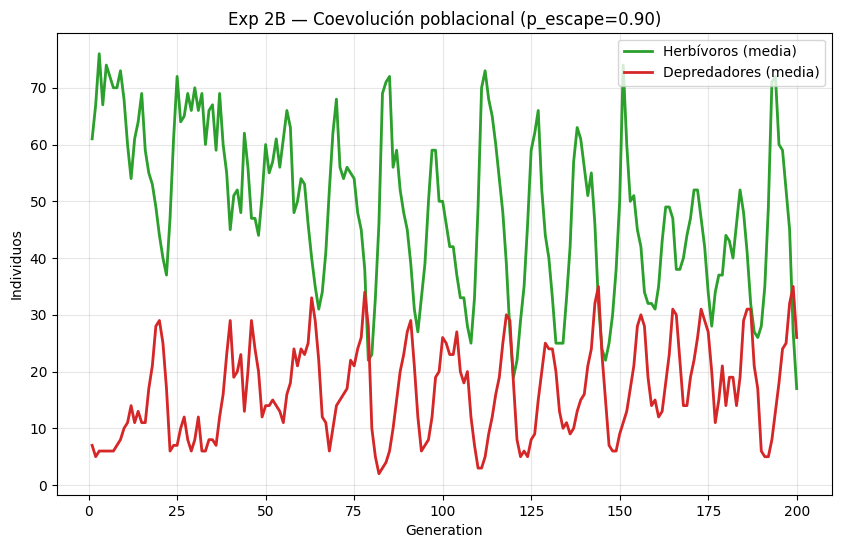

Generaciones simuladas: 200
Depredadores finales: 26
Frecuencias génicas finales:
  coward: 1.000


In [5]:
# ── Condición 2B: altruist_escape_prob = 0.90, corrida única ──────────────────
config_exp2b = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=200,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=0.30,
    altruist_escape_prob=0.90,
    predator_hunt_capacity=1,
    seed=42,
)

exp2b = SimpleExperiment(
    name="Experimento 2B — Cobardía vs Altruismo (p_escape=0.90)",
    description="50 % CowardGene / 50 % AltruistGene; probabilidad de escape del altruista = 0.90.",
    config=config_exp2b,
    herbivore_specs=herbivore_specs_exp2,
    predator_specs=predator_specs_random,
)

reports_exp2b = Simulator(exp2b).run()

plot_gene_distribution_single(
    reports_exp2b, title="Exp 2B — Cobardía vs Altruismo (p_escape=0.90)", show=True
)
plot_population_single(
    reports_exp2b, title="Exp 2B — Cobardía vs Altruismo (p_escape=0.90)", show=True
)
plot_aggregated_coevolution(
    [reports_exp2b],
    title="Exp 2B — Coevolución poblacional (p_escape=0.90)",
    show=True,
)

print(f"Generaciones simuladas: {len(reports_exp2b)}")
print(f"Depredadores finales: {reports_exp2b[-1].predator_count_end}")
print("Frecuencias génicas finales:")
for gene, freq in sorted(reports_exp2b[-1].gene_frequencies.items()):
    print(f"  {gene}: {freq:.3f}")

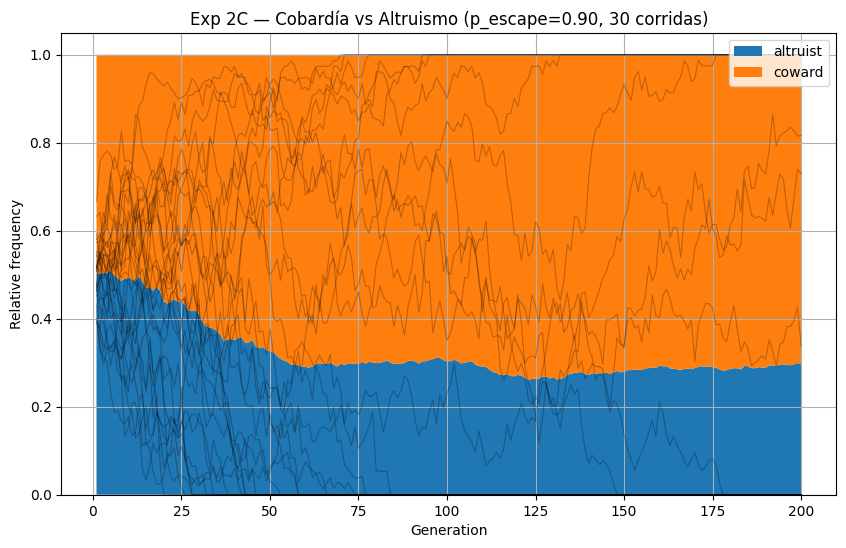

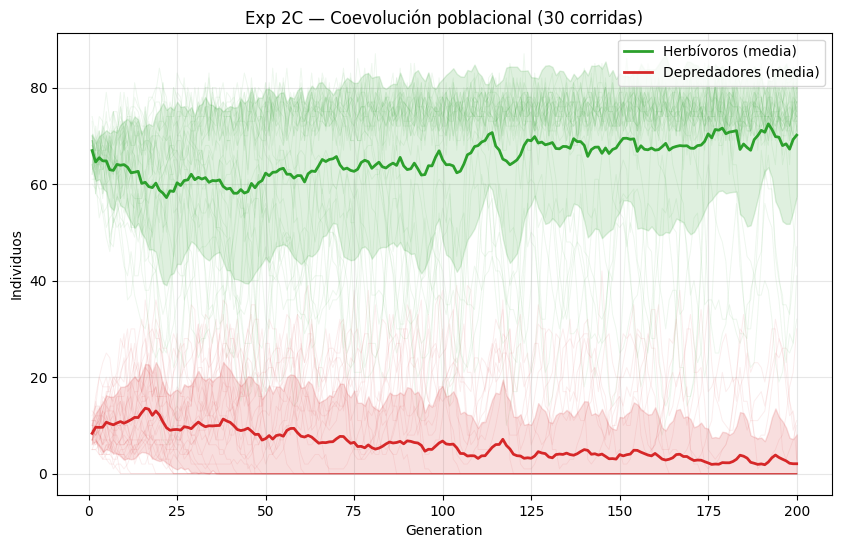

Corridas donde altruist > 50 % en la última generación: 9/30
Frecuencias génicas medias (última generación):
  altruist: 0.296 ± 0.443
  coward: 0.704 ± 0.443


In [6]:
# ── Condición 2C: p_escape = 0.90, validación estadística (30 corridas) ───────
config_exp2c = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=200,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=0.30,
    altruist_escape_prob=0.90,
    predator_hunt_capacity=1,
    seed=0,
)

exp2c = SimpleExperiment(
    name="Experimento 2C — Cobardía vs Altruismo (p_escape=0.90, 30 corridas)",
    description="Validación estadística de la condición 2B mediante 30 corridas con semillas distintas.",
    config=config_exp2c,
    herbivore_specs=herbivore_specs_exp2,
    predator_specs=predator_specs_random,
)

all_reports_exp2c = run_multiple(exp2c, config_exp2c, n_runs=30, base_seed=0)

plot_aggregated_gene_distribution(
    all_reports_exp2c,
    title="Exp 2C — Cobardía vs Altruismo (p_escape=0.90, 30 corridas)",
    show=True,
)
# plot_aggregated_population_stats(
#     all_reports_exp2c,
#     title="Exp 2C — Población agregada (30 corridas)",
#     show=True,
# )
plot_aggregated_coevolution(
    all_reports_exp2c,
    title="Exp 2C — Coevolución poblacional (30 corridas)",
    show=True,
)

altruist_wins = sum(
    1 for run in all_reports_exp2c
    if run[-1].gene_frequencies.get("altruist", 0.0) > 0.5
)
print(f"Corridas donde altruist > 50 % en la última generación: {altruist_wins}/30")
print("Frecuencias génicas medias (última generación):")
all_genes = sorted({g for run in all_reports_exp2c for g in run[-1].gene_frequencies})
for gene in all_genes:
    vals = [run[-1].gene_frequencies.get(gene, 0.0) for run in all_reports_exp2c]
    print(f"  {gene}: {statistics.mean(vals):.3f} ± {statistics.stdev(vals):.3f}")

## Experimento 3 — Altruismo selectivo con señal de barba verde

**Hipótesis**: el altruismo selectivo mediado por la señal de barba verde (`GreenBeardAltruistGene`) debería superar al altruismo puro cuando los receptores de ayuda comparten el coste de la señal, ya que el altruista evita desperdiciar su sacrificio en individuos sin la señal. Se estudia la sensibilidad del resultado al valor de `altruist_escape_prob` y a la fracción inicial de portadores.

**Condición experimental**: población mixta entre `GreenBeardAltruistGene` y `CowardGene`. Para cada combinación de fracción inicial (50 % y 10 %) y probabilidad de escape (0.10, 0.50 y 0.90) se ejecutan 30 corridas independientes. Se registra la proporción de corridas en que el rasgo se fija (> 90 %) o se extingue (< 5 %).

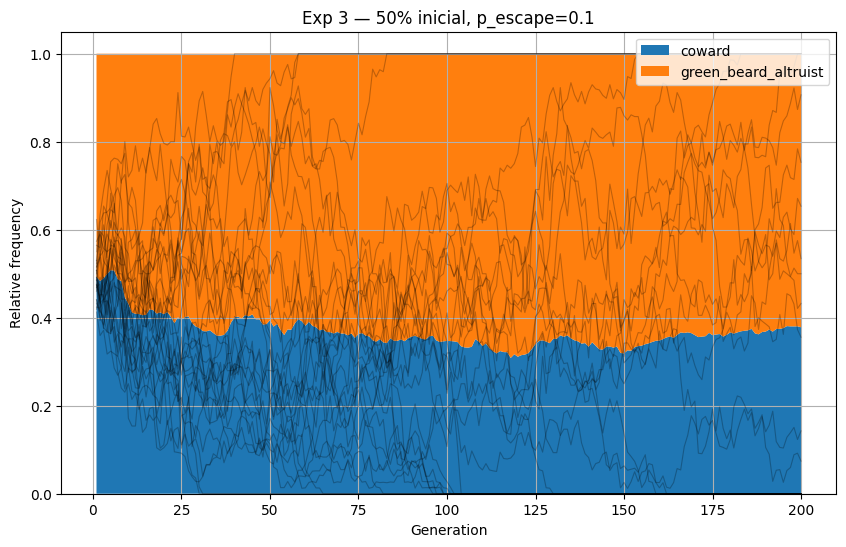

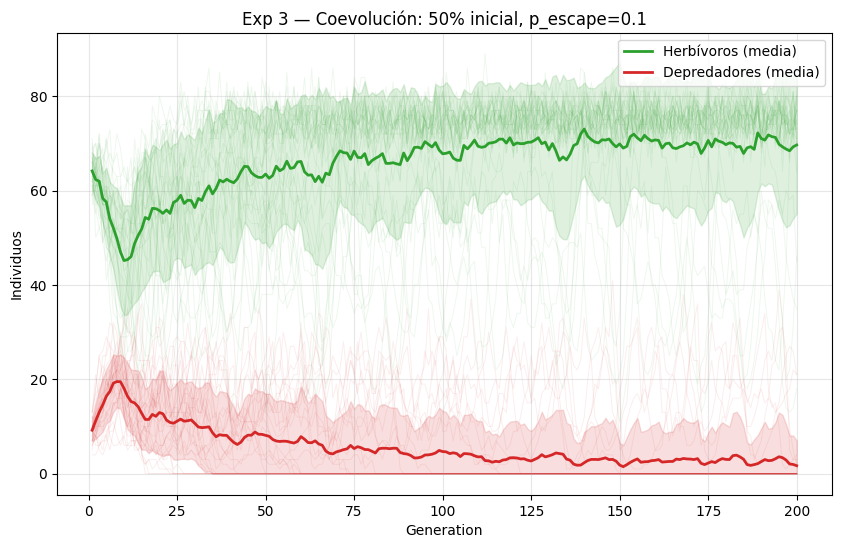

[50%] p_escape=0.1: fijado=15/30 | extinto=7/30


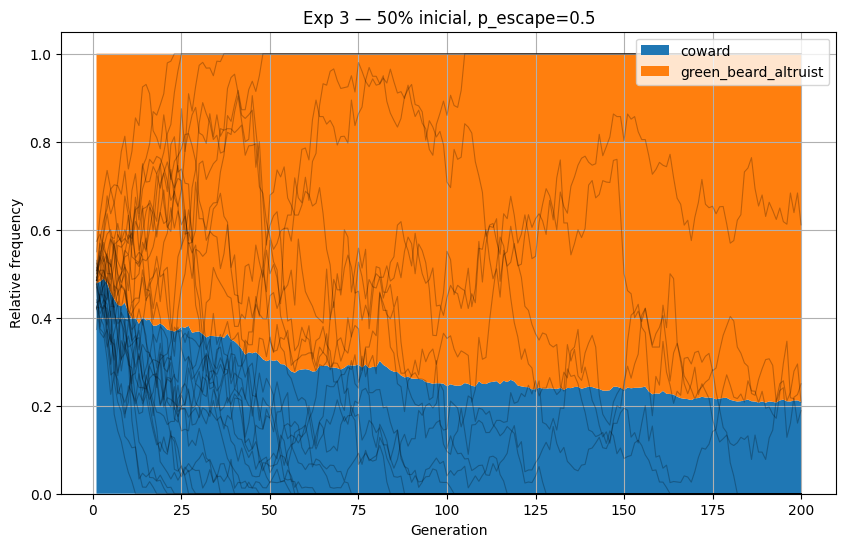

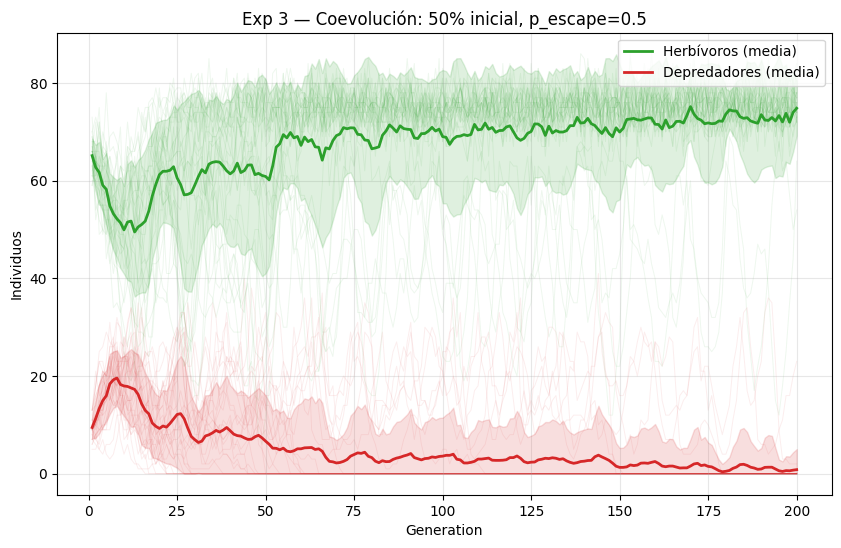

[50%] p_escape=0.5: fijado=21/30 | extinto=5/30


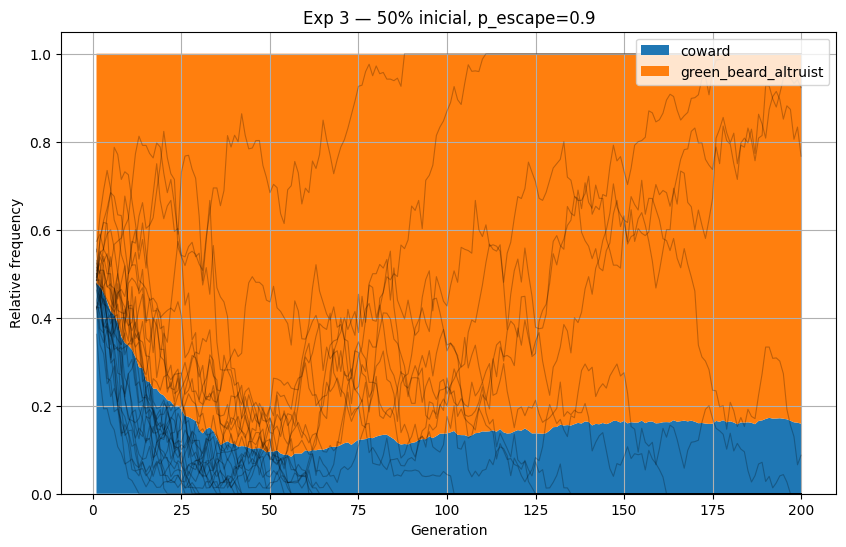

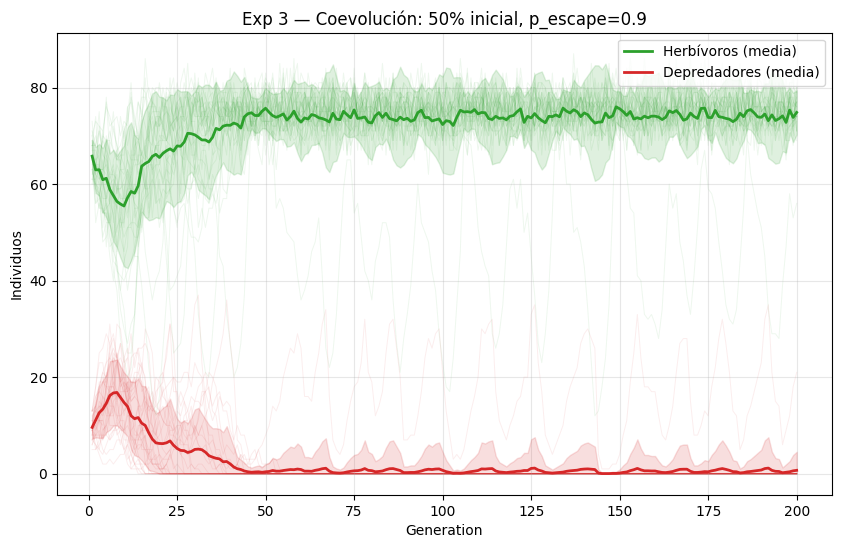

[50%] p_escape=0.9: fijado=25/30 | extinto=3/30


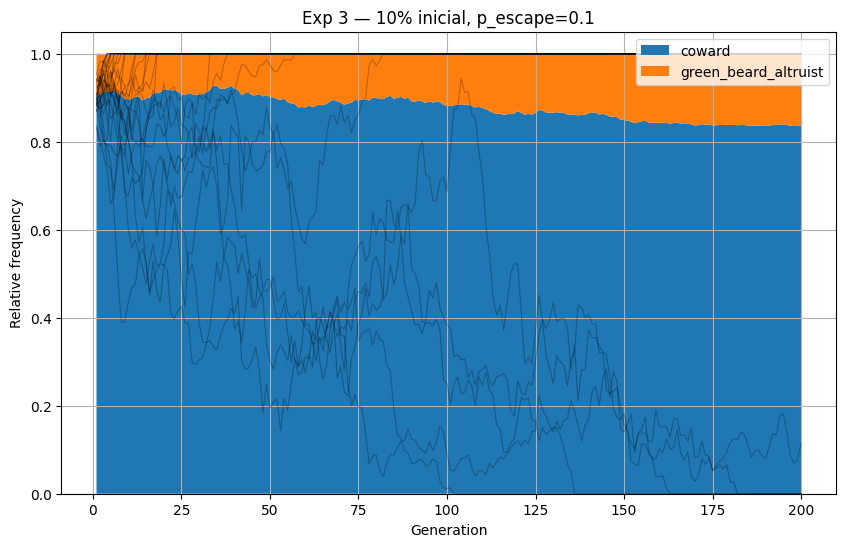

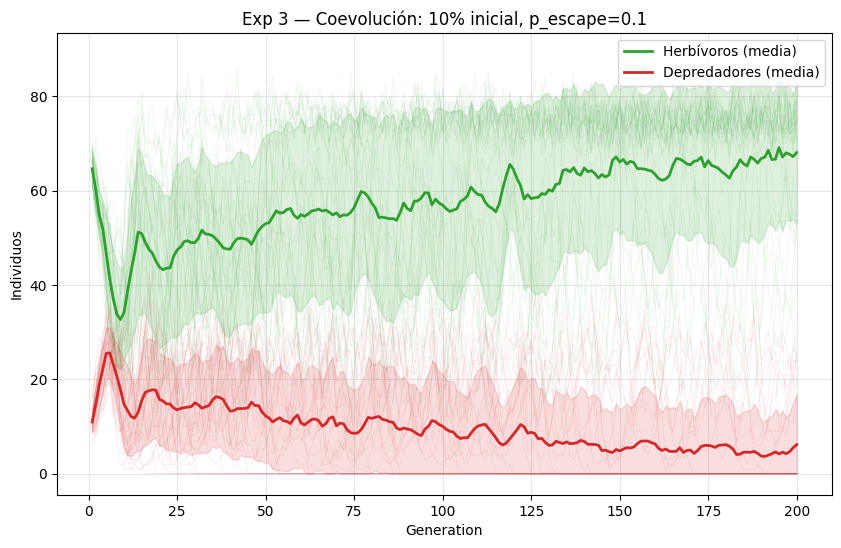

[10%] p_escape=0.1: fijado=4/30 | extinto=25/30


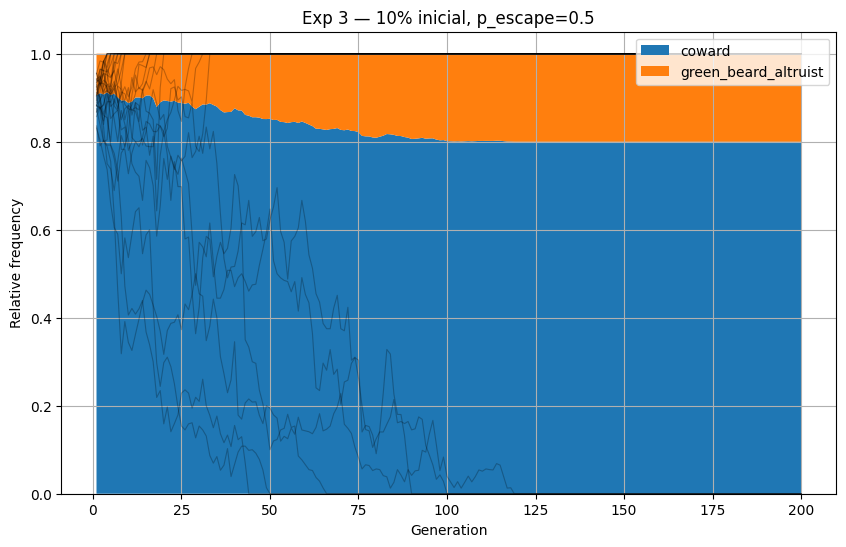

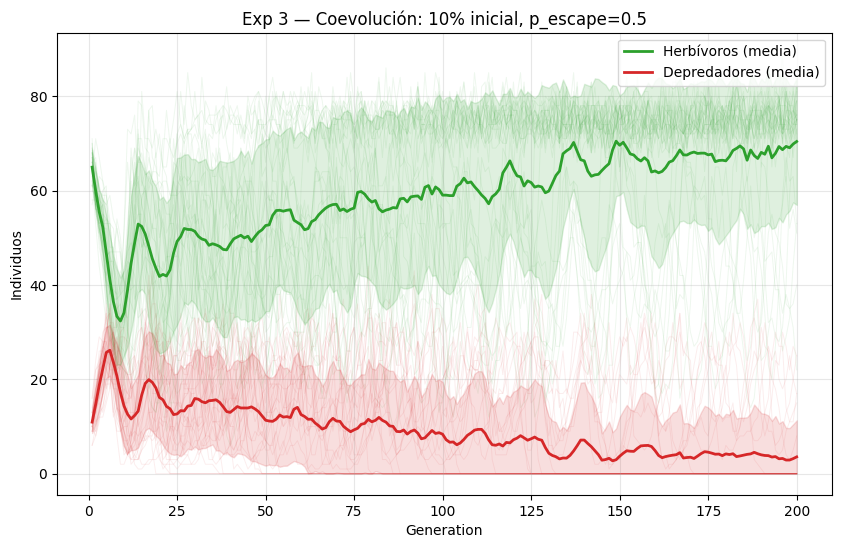

[10%] p_escape=0.5: fijado=6/30 | extinto=24/30


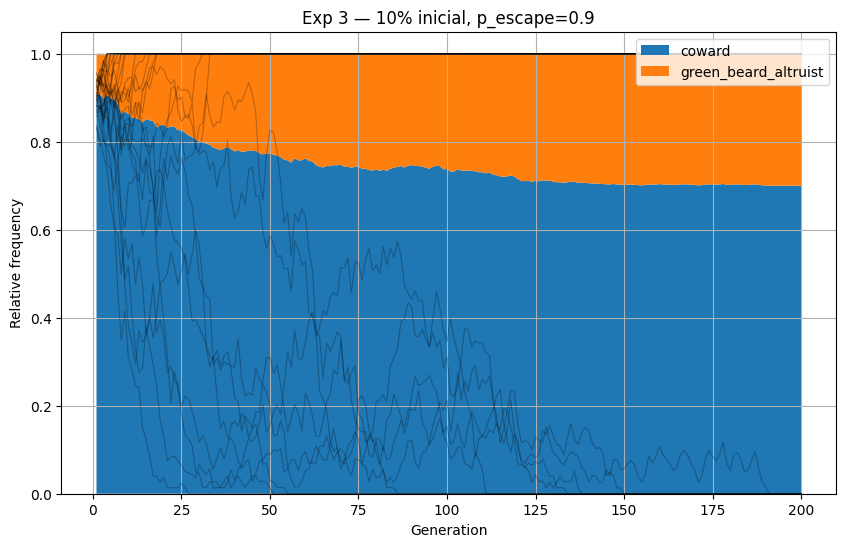

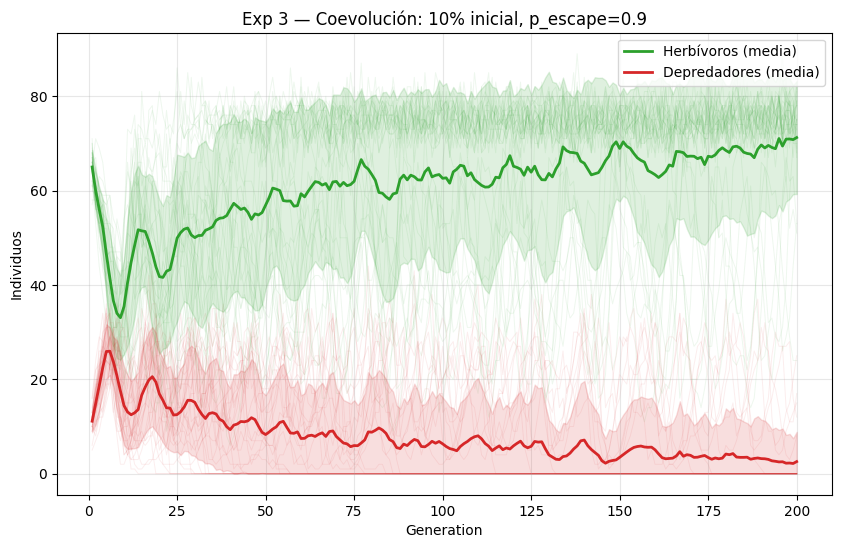

[10%] p_escape=0.9: fijado=9/30 | extinto=21/30


In [7]:
# ── Barrido: fracción inicial × altruist_escape_prob (30 corridas por combinación) ──

for frac_altruist, label_frac in [(0.50, "50%"), (0.10, "10%")]:
    frac_coward = 1.0 - frac_altruist

    herbivore_specs_exp3 = [
        (lambda: [GreenBeardAltruistGene()], frac_altruist),
        (lambda: [CowardGene()],             frac_coward),
    ]

    for p_escape in [0.10, 0.50, 0.90]:
        config_exp3 = SimulationConfig(
            num_trees=25,
            tree_capacity_min=2,
            tree_capacity_max=2,
            num_generations=200,
            initial_population=80,
            initial_predators=8,
            offspring_min=1,
            offspring_max=2,
            predator_offspring_min=1,
            predator_offspring_max=2,
            base_detection_prob=0.30,
            altruist_escape_prob=p_escape,
            predator_hunt_capacity=1,
            seed=0,
        )

        exp3 = SimpleExperiment(
            name=f"Exp 3 — GreenBeardAltruist vs Coward ({label_frac} inicial, p_escape={p_escape})",
            description=(
                f"Fracción inicial de GreenBeardAltruistGene = {label_frac}, "
                f"altruist_escape_prob = {p_escape}."
            ),
            config=config_exp3,
            herbivore_specs=herbivore_specs_exp3,
            predator_specs=predator_specs_random,
        )

        base_seed = 100 + int(frac_altruist * 100) * 10 + int(p_escape * 10)
        all_runs = run_multiple(exp3, config_exp3, n_runs=30, base_seed=base_seed)

        plot_aggregated_gene_distribution(
            all_runs,
            title=f"Exp 3 — {label_frac} inicial, p_escape={p_escape}",
            show=True,
        )
        plot_aggregated_coevolution(
            all_runs,
            title=f"Exp 3 — Coevolución: {label_frac} inicial, p_escape={p_escape}",
            show=True,
        )

        fixated = sum(
            1 for run in all_runs
            if run[-1].gene_frequencies.get("green_beard_altruist", 0.0) > 0.90
        )
        extinct = sum(
            1 for run in all_runs
            if run[-1].gene_frequencies.get("green_beard_altruist", 0.0) < 0.05
        )
        print(
            f"[{label_frac}] p_escape={p_escape}: "
            f"fijado={fixated}/30 | extinto={extinct}/30"
        )

## Experimento 4 — Cuatro estrategias desacopladas

**Hipótesis**: cuando la señal de barba verde y el comportamiento altruista no están acoplados en un mismo gen, la competencia es más compleja. Los "impostores" (portadores de `GreenBeardGene` con comportamiento cobarde) pueden explotar la señal sin incurrir en el coste del altruismo; los altruistas selectivos (`SelectiveAltruistGene`) ayudan a quienes tengan la señal, independientemente de su comportamiento. La interacción entre estos fenotipos puede exponer la fragilidad de los sistemas de señalización no ligados al coste.

**Condición experimental**: la población inicial se distribuye a partes iguales entre cuatro fenotipos:
- `CowardGene` — cobarde puro
- `GreenBeardGene` + `CowardGene` — portador de la señal sin comportamiento cooperativo (impostor)
- `SelectiveAltruistGene` — altruista selectivo sin señal propia
- `GreenBeardAltruistGene` — portador de la señal y altruista selectivo integrados

Se ejecutan 30 corridas de 400 generaciones para capturar dinámicas evolutivas de largo plazo.

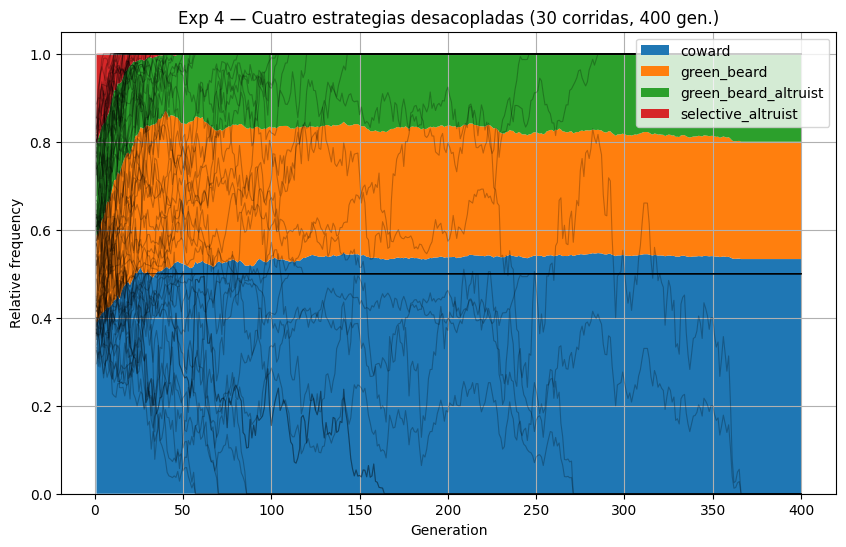

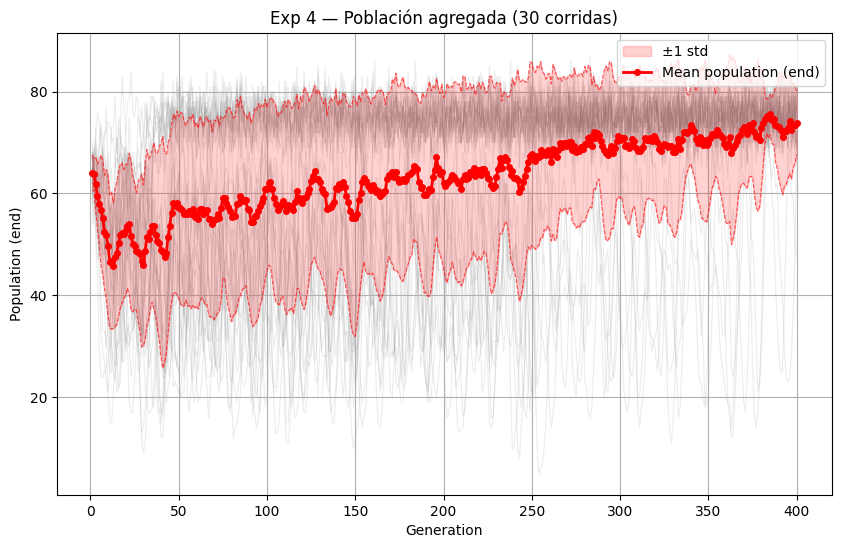

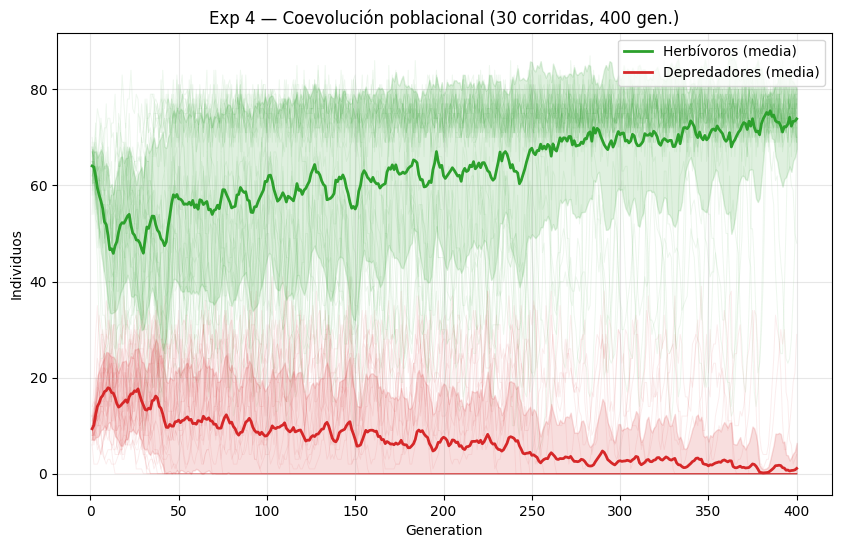

Frecuencias génicas medias en la última generación:
  coward: 0.533 ± 0.346
  green_beard: 0.267 ± 0.254
  green_beard_altruist: 0.200 ± 0.407


In [8]:
# ── Configuración ─────────────────────────────────────────────────────────────
config_exp4 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=400,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=0.30,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

# ── Definición de poblaciones ─────────────────────────────────────────────────
herbivore_specs_exp4 = [
    (lambda: [CowardGene()],                         0.25),
    (lambda: [GreenBeardGene(), CowardGene()],        0.25),
    (lambda: [SelectiveAltruistGene()],               0.25),
    (lambda: [GreenBeardAltruistGene()],              0.25),
]

# ── Objeto experimento ────────────────────────────────────────────────────────
exp4 = SimpleExperiment(
    name="Experimento 4 — Cuatro estrategias desacopladas",
    description=(
        "Competencia entre cobardía pura, señalización sin cooperación (impostor), "
        "altruismo selectivo sin señal y altruismo con señal integrada."
    ),
    config=config_exp4,
    herbivore_specs=herbivore_specs_exp4,
    predator_specs=predator_specs_random,
)

# ── Ejecución (30 corridas, 400 generaciones) ─────────────────────────────────
all_reports_exp4 = run_multiple(exp4, config_exp4, n_runs=30, base_seed=300)

# ── Visualización ──────────────────────────────────────────────────────────────
plot_aggregated_gene_distribution(
    all_reports_exp4,
    title="Exp 4 — Cuatro estrategias desacopladas (30 corridas, 400 gen.)",
    show=True,
)
plot_aggregated_population_stats(
    all_reports_exp4,
    title="Exp 4 — Población agregada (30 corridas)",
    show=True,
)
plot_aggregated_coevolution(
    all_reports_exp4,
    title="Exp 4 — Coevolución poblacional (30 corridas, 400 gen.)",
    show=True,
)

# ── Estadísticas resumen ───────────────────────────────────────────────────────
print("Frecuencias génicas medias en la última generación:")
all_genes_exp4 = sorted({g for run in all_reports_exp4 for g in run[-1].gene_frequencies})
for gene in all_genes_exp4:
    vals = [run[-1].gene_frequencies.get(gene, 0.0) for run in all_reports_exp4]
    print(f"  {gene}: {statistics.mean(vals):.3f} ± {statistics.stdev(vals):.3f}")

## Experimento 5 — Camuflaje en herbívoros

**Hipótesis**: los herbívoros portadores de `CamouflageHerbivoreGene` poseen una doble ventaja adaptativa: son invisibles para los depredadores durante la selección del árbol objetivo (no atraen visitas) y disponen de un 40 % de probabilidad de evasión individual durante la caza. Se espera que el rasgo se fije progresivamente, con mayor velocidad cuanto mayor sea la probabilidad base de detección.

**Condición experimental**: población mixta entre `CowardGene` y `CowardGene + CamouflageHerbivoreGene`. Se barren dos fracciones iniciales de camuflados (50 % y 10 %) y tres valores de `base_detection_prob` (0.10, 0.30 y 0.50), con 30 corridas por combinación.

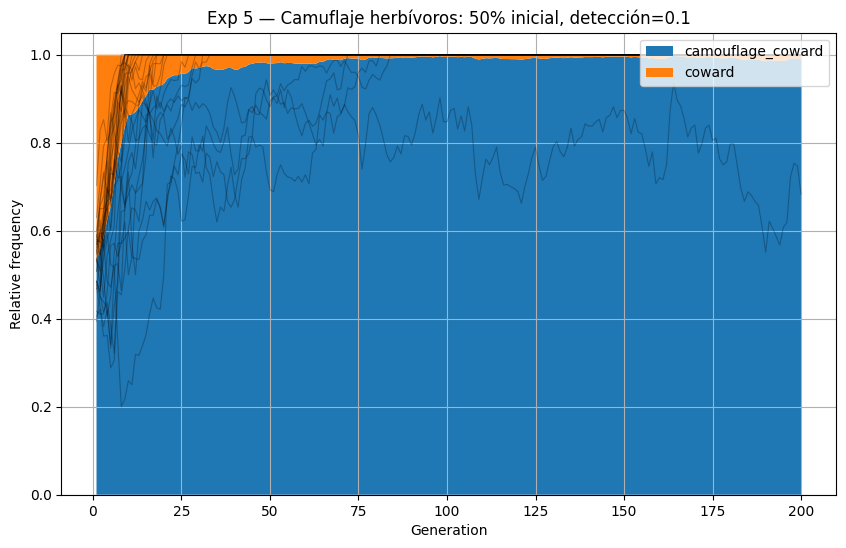

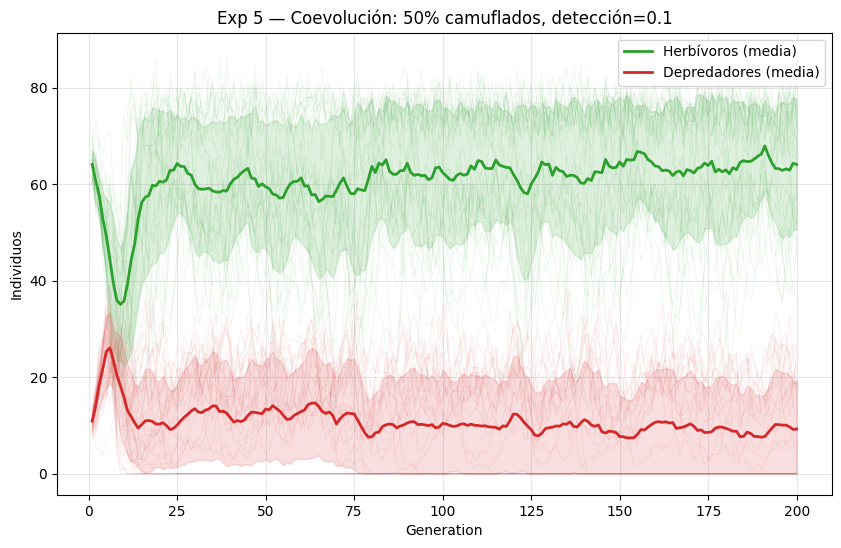

[frac=50%, detección=0.1] fijado=29/30 | extinto=0/30


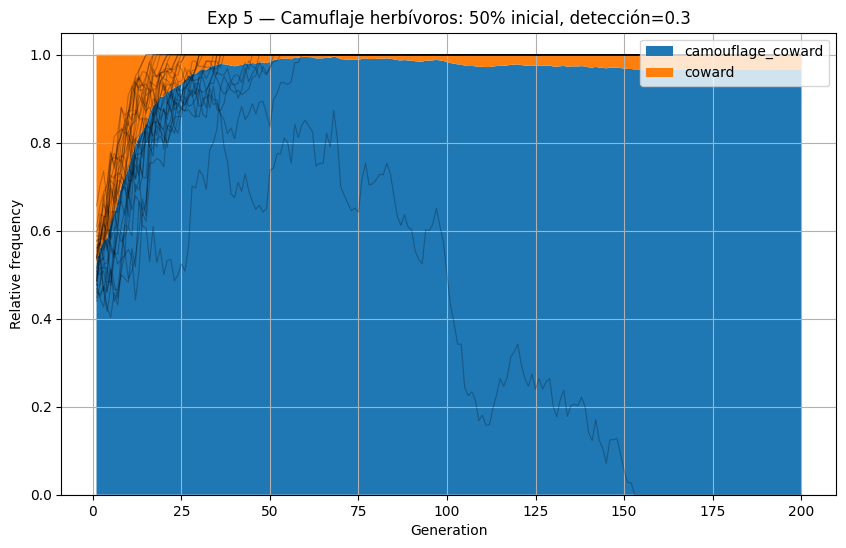

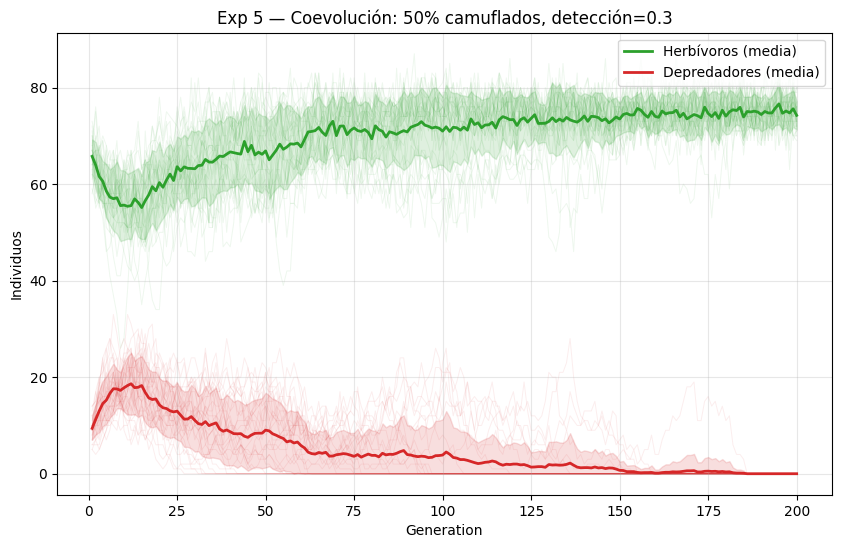

[frac=50%, detección=0.3] fijado=29/30 | extinto=1/30


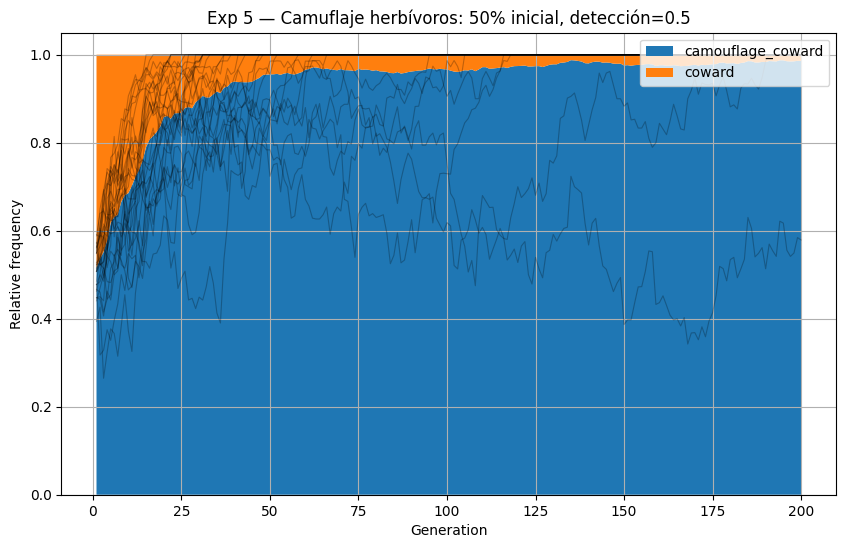

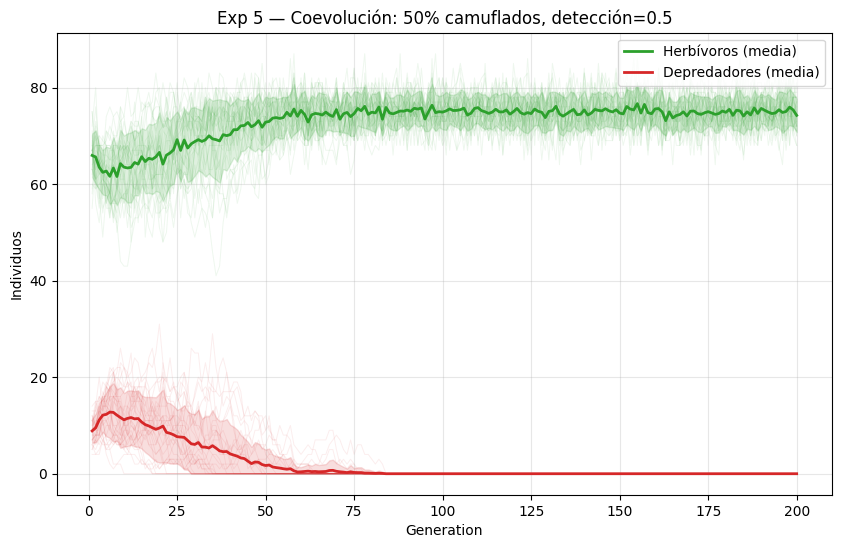

[frac=50%, detección=0.5] fijado=29/30 | extinto=0/30


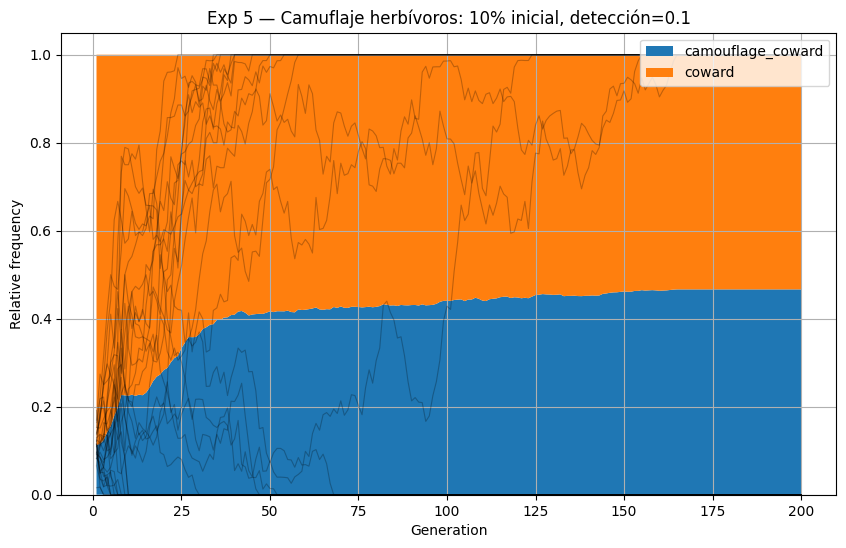

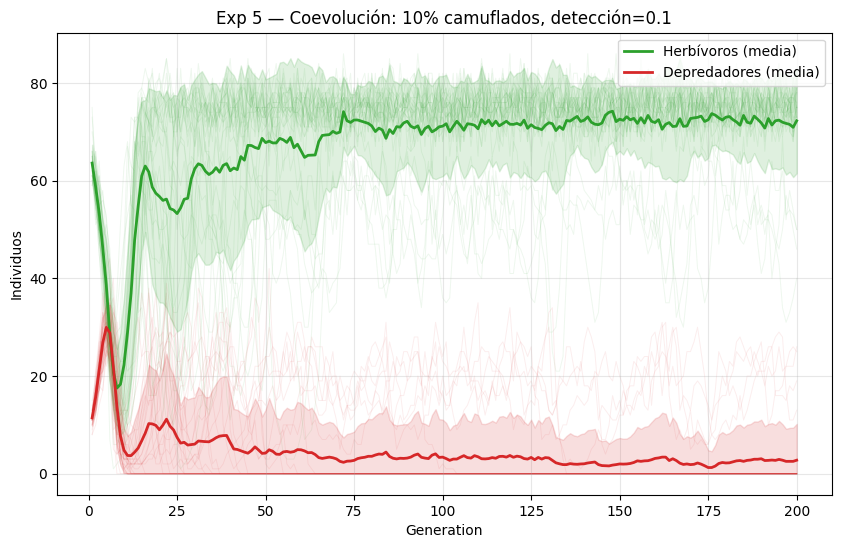

[frac=10%, detección=0.1] fijado=14/30 | extinto=16/30


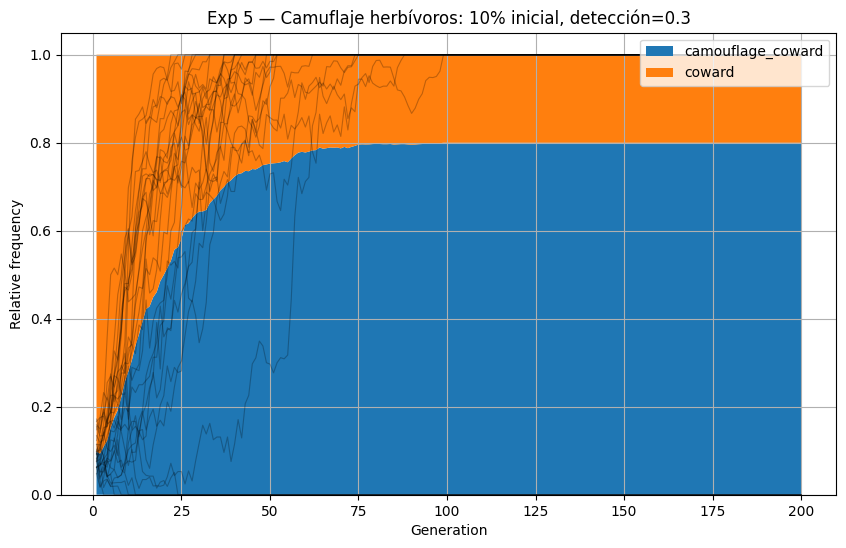

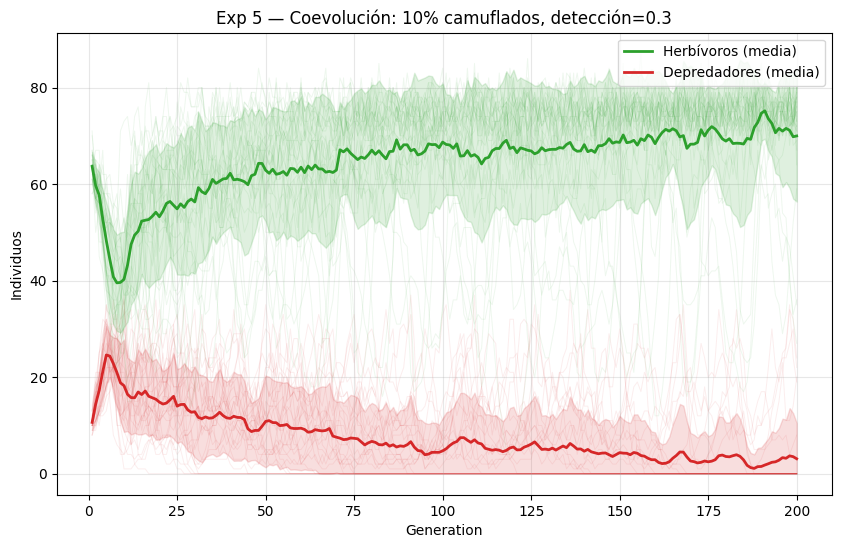

[frac=10%, detección=0.3] fijado=24/30 | extinto=6/30


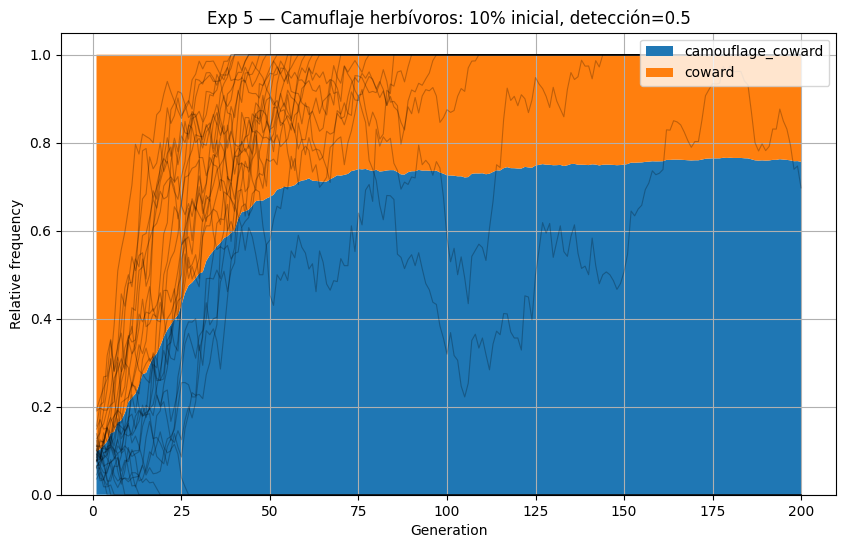

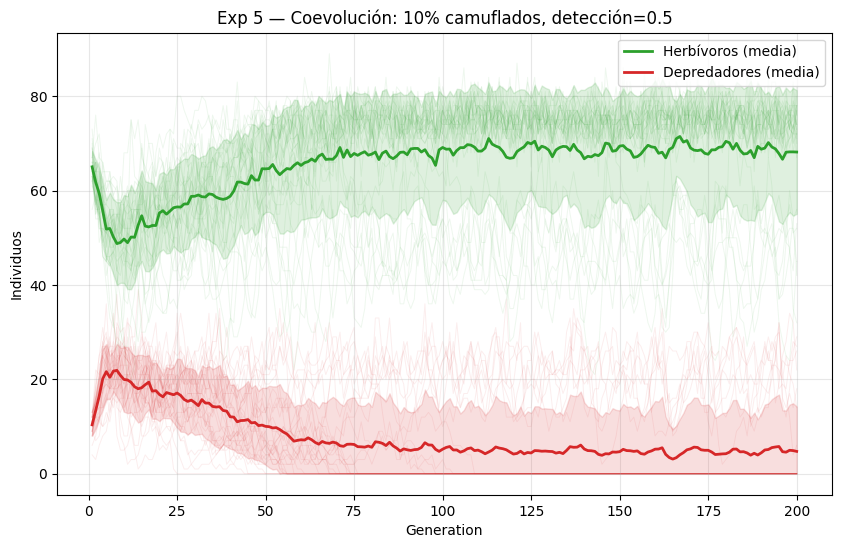

[frac=10%, detección=0.5] fijado=22/30 | extinto=7/30


In [9]:
# ── Barrido: fracción inicial × base_detection_prob (30 corridas por combinación) ──

for frac_camo in [0.50, 0.10]:
    frac_plain = 1.0 - frac_camo

    herbivore_specs_exp5 = [
        (lambda: [CowardGene()],          frac_plain),
        (lambda: [CamouflageCowardGene()], frac_camo),
    ]

    for base_detection_prob in [0.10, 0.30, 0.50]:
        config_exp5 = SimulationConfig(
            num_trees=25,
            tree_capacity_min=2,
            tree_capacity_max=2,
            num_generations=200,
            initial_population=80,
            initial_predators=8,
            offspring_min=1,
            offspring_max=2,
            predator_offspring_min=1,
            predator_offspring_max=2,
            base_detection_prob=base_detection_prob,
            altruist_escape_prob=0.50,
            predator_hunt_capacity=1,
            seed=0,
        )

        exp5 = SimpleExperiment(
            name=(
                f"Exp 5 — Camuflaje herbívoros ({frac_camo:.0%} inicial, "
                f"detección={base_detection_prob})"
            ),
            description=(
                f"Fracción inicial de CamouflageCowardGene = {frac_camo:.0%}, "
                f"base_detection_prob = {base_detection_prob}."
            ),
            config=config_exp5,
            herbivore_specs=herbivore_specs_exp5,
            predator_specs=predator_specs_random,
        )

        base_seed = 10_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
        all_runs = run_multiple(exp5, config_exp5, n_runs=30, base_seed=base_seed)

        plot_aggregated_gene_distribution(
            all_runs,
            title=(
                f"Exp 5 — Camuflaje herbívoros: {frac_camo:.0%} inicial, "
                f"detección={base_detection_prob}"
            ),
            show=True,
        )
        plot_aggregated_coevolution(
            all_runs,
            title=f"Exp 5 — Coevolución: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
            show=True,
        )

        camo_key = "camouflage_coward"
        fixated = sum(1 for run in all_runs if run[-1].gene_frequencies.get(camo_key, 0.0) > 0.90)
        extinct  = sum(1 for run in all_runs if run[-1].gene_frequencies.get(camo_key, 0.0) < 0.05)
        print(
            f"[frac={frac_camo:.0%}, detección={base_detection_prob}] "
            f"fijado={fixated}/30 | extinto={extinct}/30"
        )

## Experimento 6 — Camuflaje en depredadores

**Hipótesis**: los depredadores portadores de `CamouflagePredatorGene` reducen en un 60 % la probabilidad de que los herbívoros los detecten, lo que incrementa su eficacia de caza. Se espera que el rasgo se fije en la población de depredadores, con una velocidad de fijación proporcional al valor de `base_detection_prob`.

**Condición experimental**: fondo de herbívoros homogéneo (`CowardGene` puro). La población de depredadores se divide entre individuos sin camuflaje y portadores de `CamouflagePredatorGene`. Se barren las mismas dos fracciones iniciales y los mismos tres niveles de detección que en el experimento anterior.

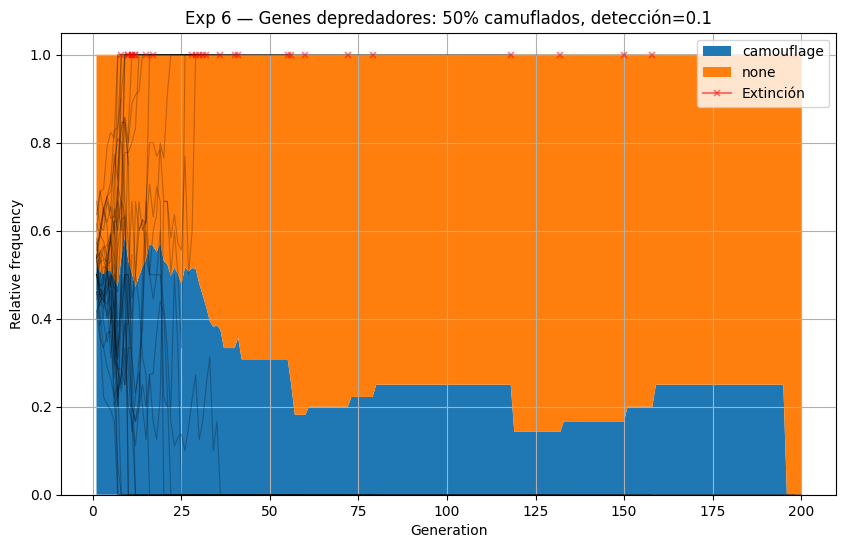

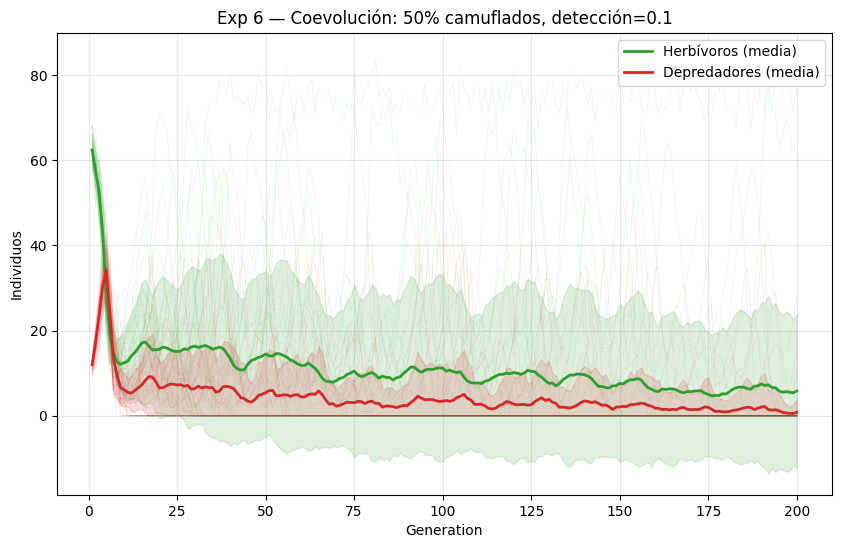

[frac=50%, detección=0.1] fijado=13/30 | extinto=14/30


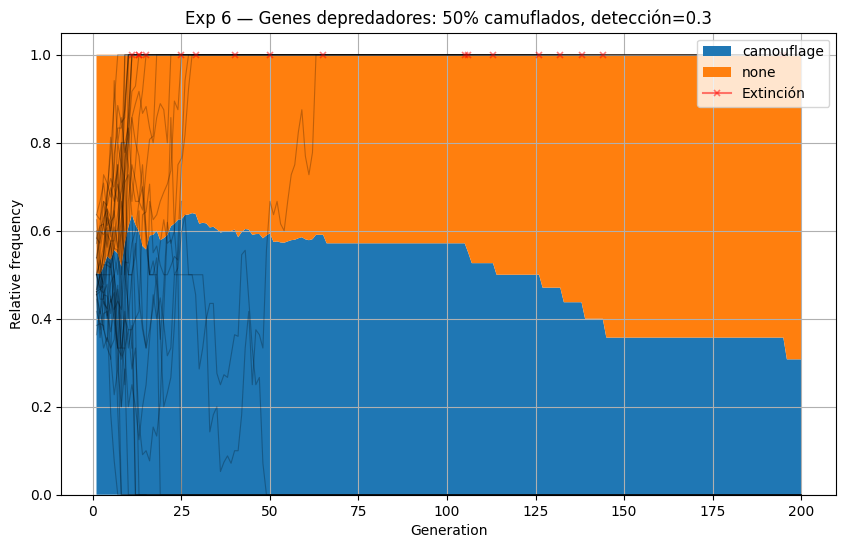

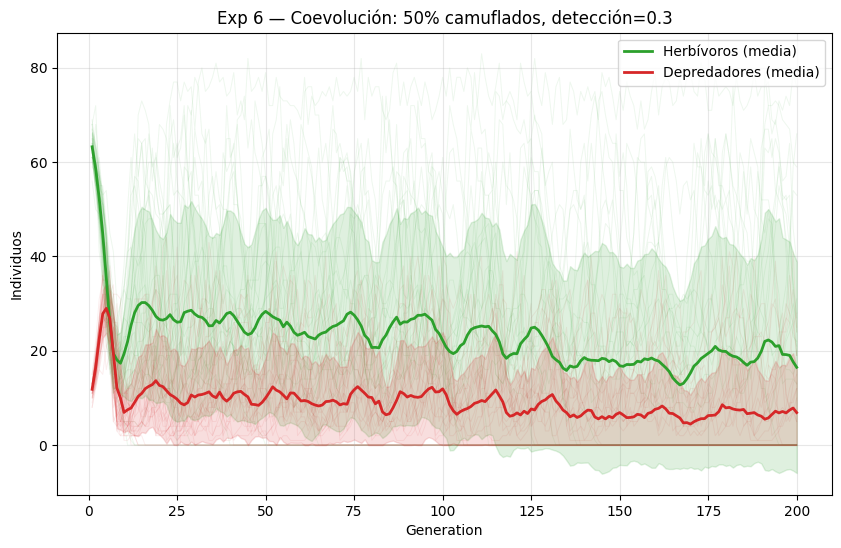

[frac=50%, detección=0.3] fijado=18/30 | extinto=10/30


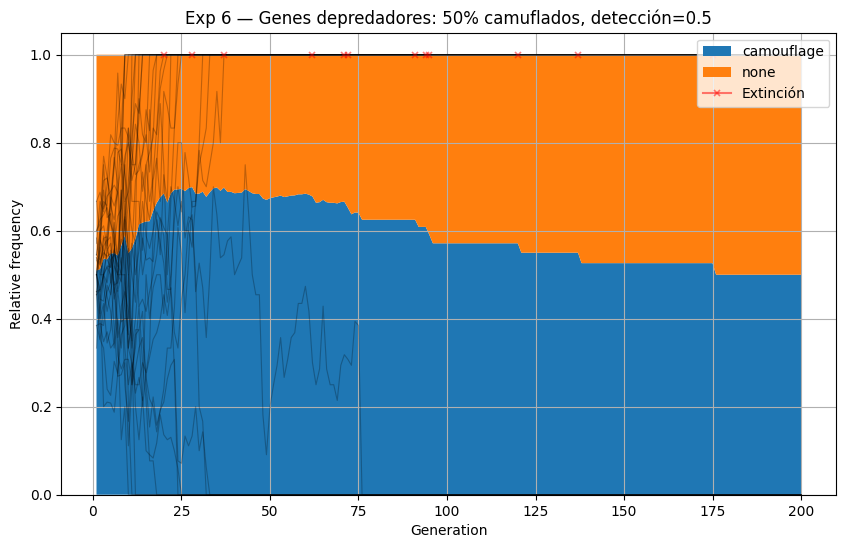

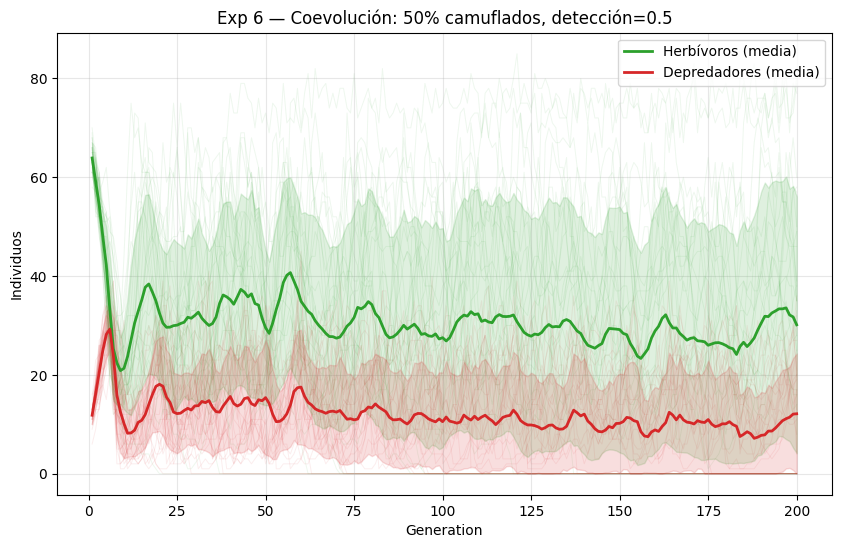

[frac=50%, detección=0.5] fijado=18/30 | extinto=12/30


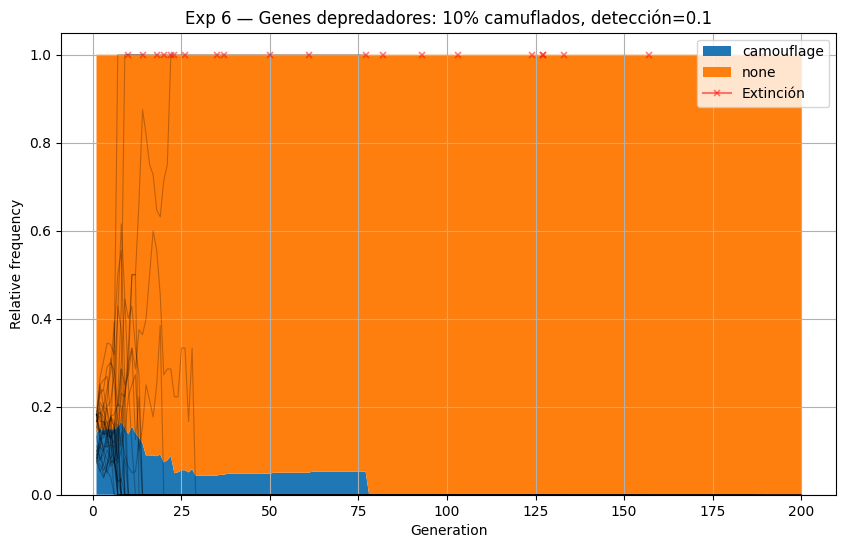

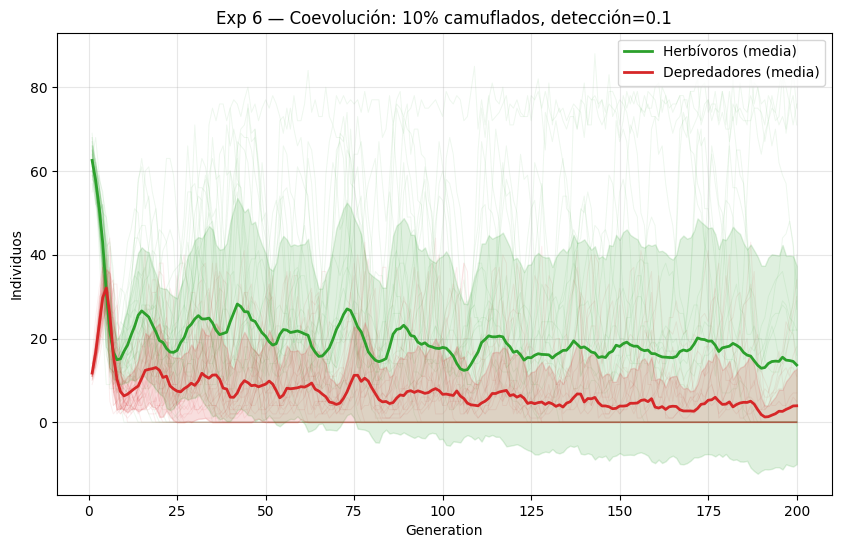

[frac=10%, detección=0.1] fijado=3/30 | extinto=27/30


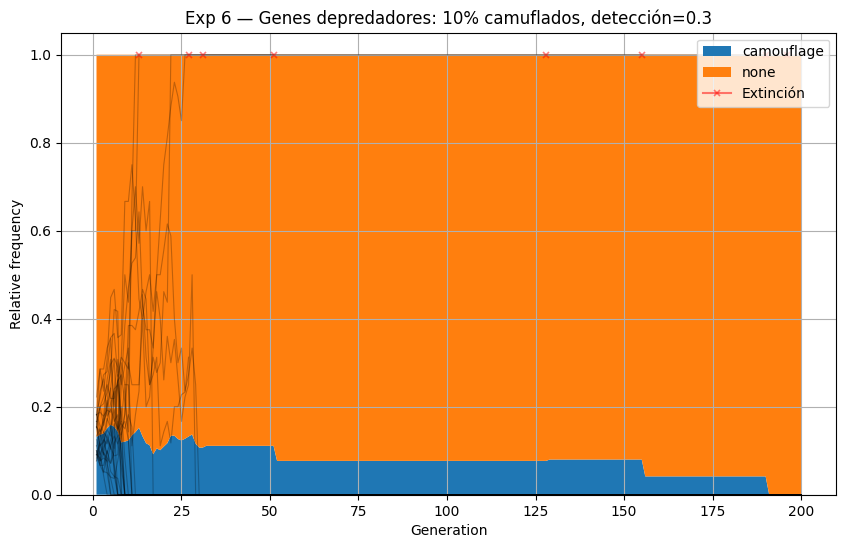

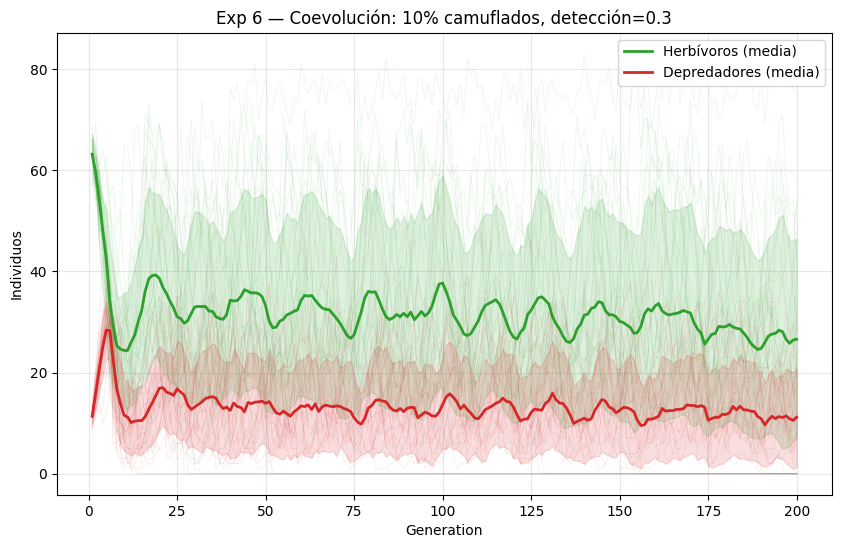

[frac=10%, detección=0.3] fijado=4/30 | extinto=25/30


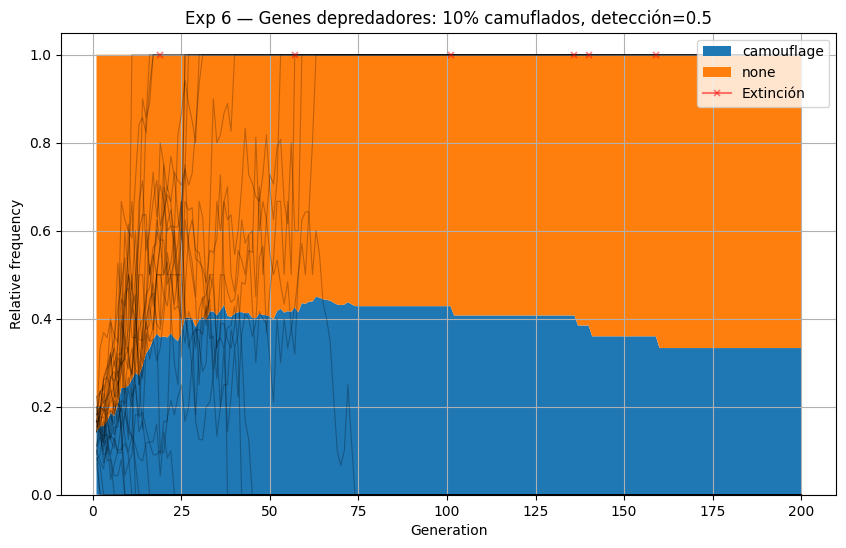

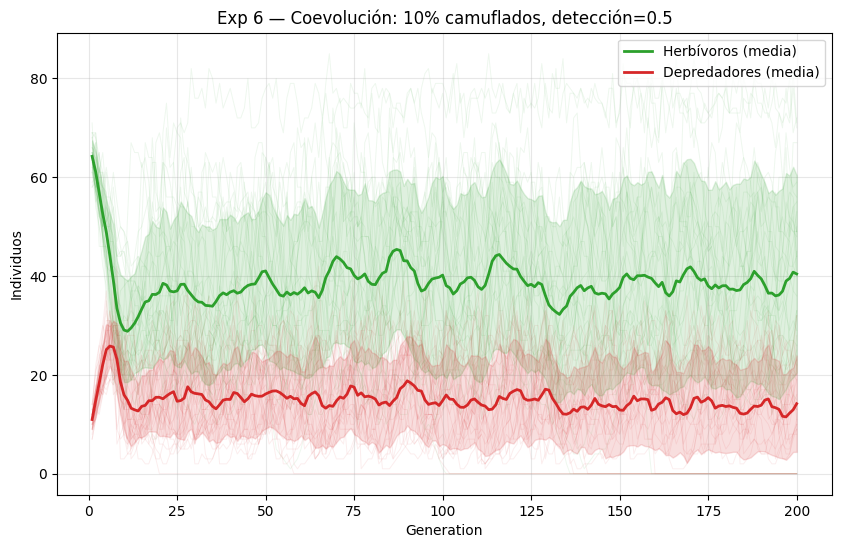

[frac=10%, detección=0.5] fijado=11/30 | extinto=19/30


In [10]:
# ── Fondo de herbívoros fijo: 100 % CowardGene ────────────────────────────────
herbivore_specs_background = [(lambda: [CowardGene()], 1.0)]

# ── Barrido: fracción inicial × base_detection_prob (30 corridas por combinación) ──

for frac_camo in [0.50, 0.10]:
    frac_plain = 1.0 - frac_camo

    predator_specs_exp6 = [
        (lambda: [],                         frac_plain),
        (lambda: [CamouflagePredatorGene()], frac_camo),
    ]

    for base_detection_prob in [0.10, 0.30, 0.50]:
        config_exp6 = SimulationConfig(
            num_trees=25,
            tree_capacity_min=2,
            tree_capacity_max=2,
            num_generations=200,
            initial_population=80,
            initial_predators=8,
            offspring_min=1,
            offspring_max=2,
            predator_offspring_min=1,
            predator_offspring_max=2,
            base_detection_prob=base_detection_prob,
            altruist_escape_prob=0.50,
            predator_hunt_capacity=1,
            seed=0,
        )

        exp6 = SimpleExperiment(
            name=(
                f"Exp 6 — Camuflaje depredadores ({frac_camo:.0%} inicial, "
                f"detección={base_detection_prob})"
            ),
            description=(
                f"Fracción inicial de CamouflagePredatorGene = {frac_camo:.0%}, "
                f"base_detection_prob = {base_detection_prob}."
            ),
            config=config_exp6,
            herbivore_specs=herbivore_specs_background,
            predator_specs=predator_specs_exp6,
        )

        base_seed = 20_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
        all_runs = run_multiple(exp6, config_exp6, n_runs=30, base_seed=base_seed)

        plot_aggregated_predator_gene_evolution(
            all_runs,
            title=(
                f"Exp 6 — Genes depredadores: {frac_camo:.0%} camuflados, "
                f"detección={base_detection_prob}"
            ),
            show=True,
        )
        plot_aggregated_coevolution(
            all_runs,
            title=f"Exp 6 — Coevolución: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
            show=True,
        )

        camo_key = "camouflage"
        fixated = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get(camo_key, 0.0) > 0.90)
        extinct  = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get(camo_key, 0.0) < 0.05)
        print(
            f"[frac={frac_camo:.0%}, detección={base_detection_prob}] "
            f"fijado={fixated}/30 | extinto={extinct}/30"
        )

## Experimento 7 — Coevolución del camuflaje

**Hipótesis**: cuando ambas poblaciones poseen variantes camufladas simultáneamente, se genera una dinámica coevolutiva. El camuflaje en los herbívoros reduce su visibilidad y, por tanto, la presión que experimentan; el camuflaje en los depredadores reduce la probabilidad de detección y, en consecuencia, incrementa la presión sobre los herbívoros. La interacción recíproca entre ambos rasgos puede producir equilibrios distintos a los observados cuando el camuflaje estaba presente en una sola especie.

**Condición experimental**: se introducen simultáneamente variantes camufladas en herbívoros (`CamouflageHerbivoreGene`) y depredadores (`CamouflagePredatorGene`) con las mismas proporciones iniciales. La duración se extiende a 300 generaciones para capturar dinámicas coevolutivas de largo plazo.

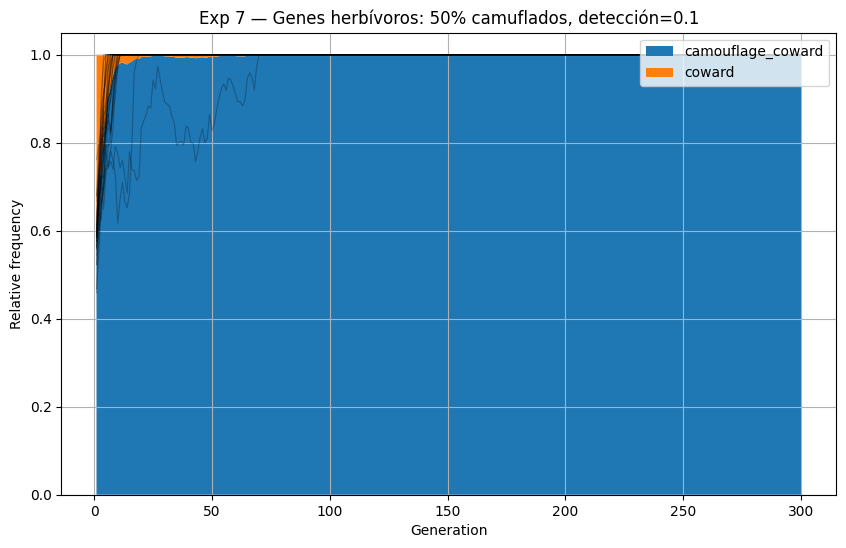

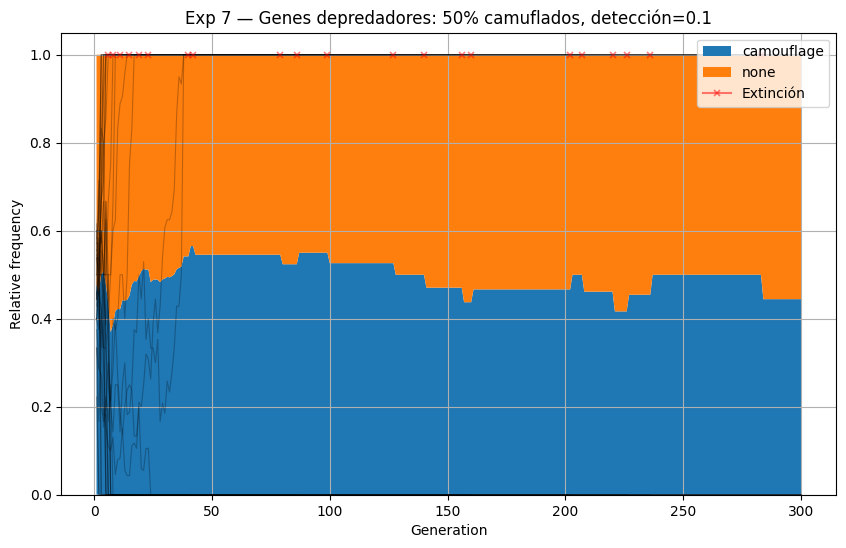

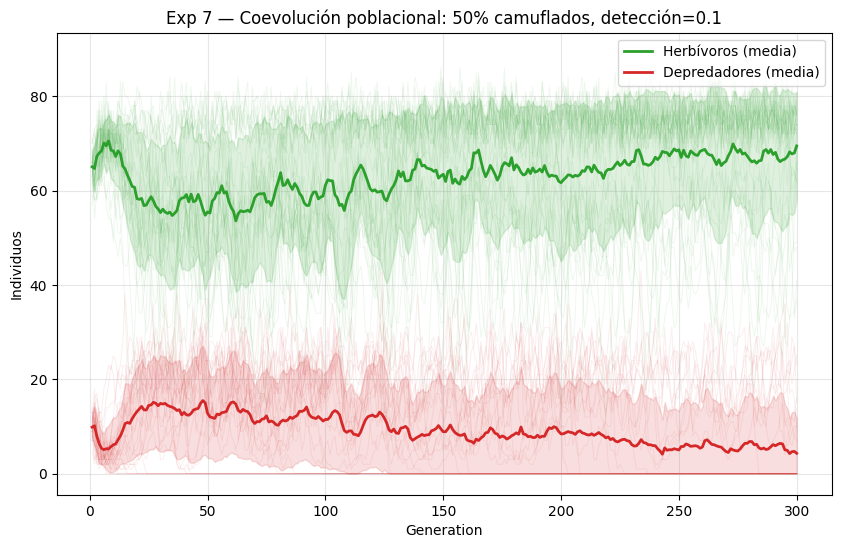

[50%, det=0.1] herb_fijado=30/30 | pred_fijado=4/30


In [11]:
# ── Combinación 1/6: frac_camo=50%, base_detection_prob=0.10 ─────────────────
frac_camo, base_detection_prob = 0.50, 0.10
frac_plain = 1.0 - frac_camo

herbivore_specs_exp7 = [
    (lambda: [CowardGene()],            frac_plain),
    (lambda: [CamouflageCowardGene()],  frac_camo),
]
predator_specs_exp7 = [
    (lambda: [],                          frac_plain),
    (lambda: [CamouflagePredatorGene()],  frac_camo),
]

config_exp7 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp7 = SimpleExperiment(
    name=f"Exp 7 — Coevolución ({frac_camo:.0%} inicial, detección={base_detection_prob})",
    description=(
        f"CamouflageCowardGene y CamouflagePredatorGene simultáneos. "
        f"Fracción inicial = {frac_camo:.0%}, base_detection_prob = {base_detection_prob}."
    ),
    config=config_exp7,
    herbivore_specs=herbivore_specs_exp7,
    predator_specs=predator_specs_exp7,
)

base_seed = 30_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
all_runs = run_multiple(exp7, config_exp7, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 7 — Genes herbívoros: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 7 — Genes depredadores: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 7 — Coevolución poblacional: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)

herb_fixed = sum(1 for run in all_runs if run[-1].gene_frequencies.get("camouflage_coward", 0.0) > 0.90)
pred_fixed = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90)
print(f"[{frac_camo:.0%}, det={base_detection_prob}] herb_fijado={herb_fixed}/30 | pred_fijado={pred_fixed}/30")

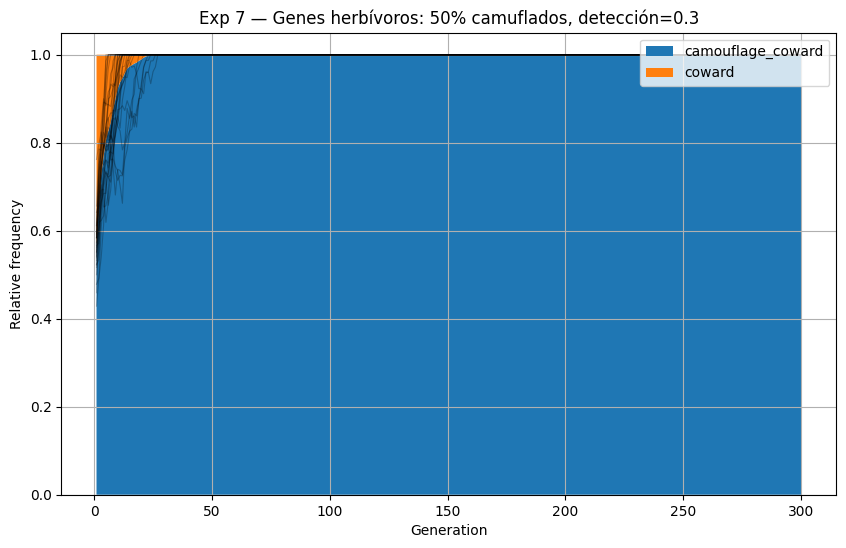

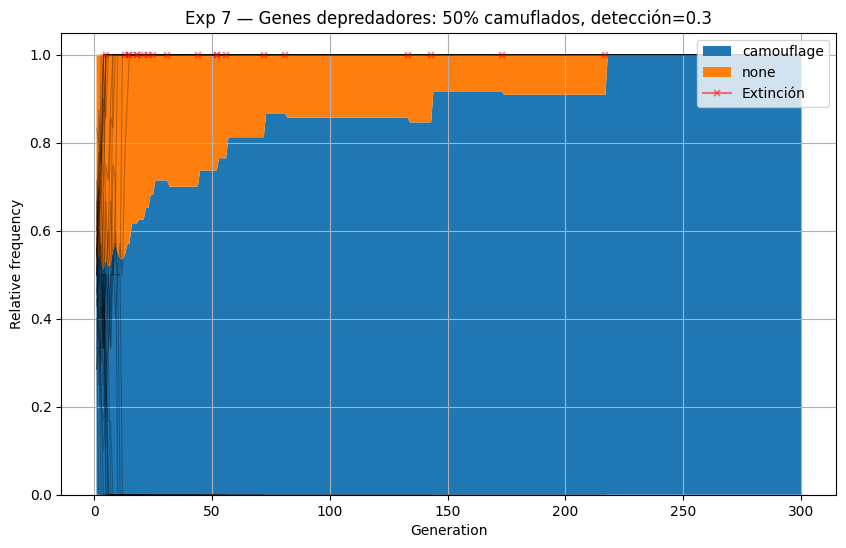

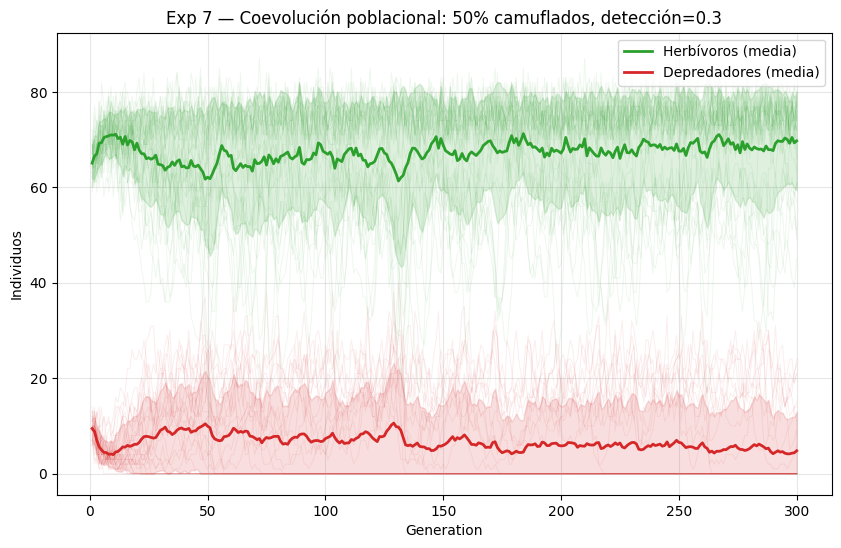

[50%, det=0.3] herb_fijado=30/30 | pred_fijado=9/30


In [12]:
# ── Combinación 2/6: frac_camo=50%, base_detection_prob=0.30 ─────────────────
frac_camo, base_detection_prob = 0.50, 0.30
frac_plain = 1.0 - frac_camo

herbivore_specs_exp7 = [
    (lambda: [CowardGene()],            frac_plain),
    (lambda: [CamouflageCowardGene()],  frac_camo),
]
predator_specs_exp7 = [
    (lambda: [],                          frac_plain),
    (lambda: [CamouflagePredatorGene()],  frac_camo),
]

config_exp7 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp7 = SimpleExperiment(
    name=f"Exp 7 — Coevolución ({frac_camo:.0%} inicial, detección={base_detection_prob})",
    description=(
        f"CamouflageCowardGene y CamouflagePredatorGene simultáneos. "
        f"Fracción inicial = {frac_camo:.0%}, base_detection_prob = {base_detection_prob}."
    ),
    config=config_exp7,
    herbivore_specs=herbivore_specs_exp7,
    predator_specs=predator_specs_exp7,
)

base_seed = 30_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
all_runs = run_multiple(exp7, config_exp7, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 7 — Genes herbívoros: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 7 — Genes depredadores: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 7 — Coevolución poblacional: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)

herb_fixed = sum(1 for run in all_runs if run[-1].gene_frequencies.get("camouflage_coward", 0.0) > 0.90)
pred_fixed = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90)
print(f"[{frac_camo:.0%}, det={base_detection_prob}] herb_fijado={herb_fixed}/30 | pred_fijado={pred_fixed}/30")

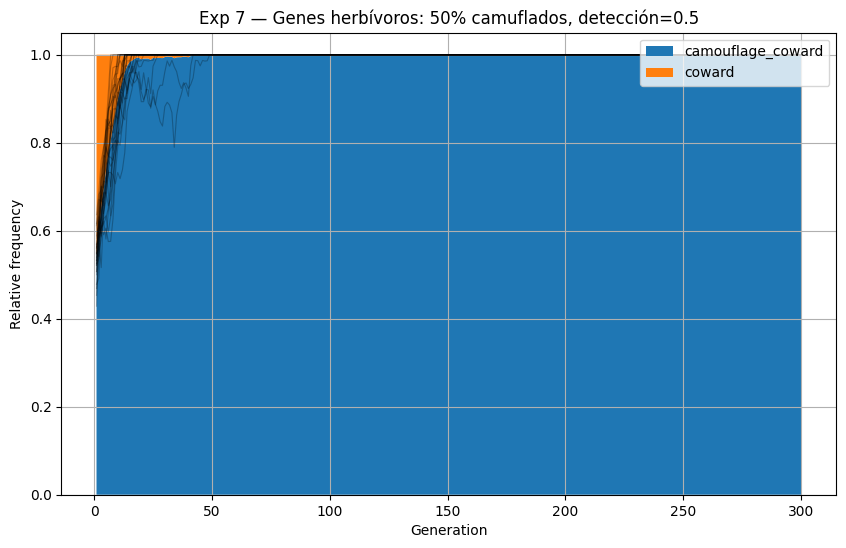

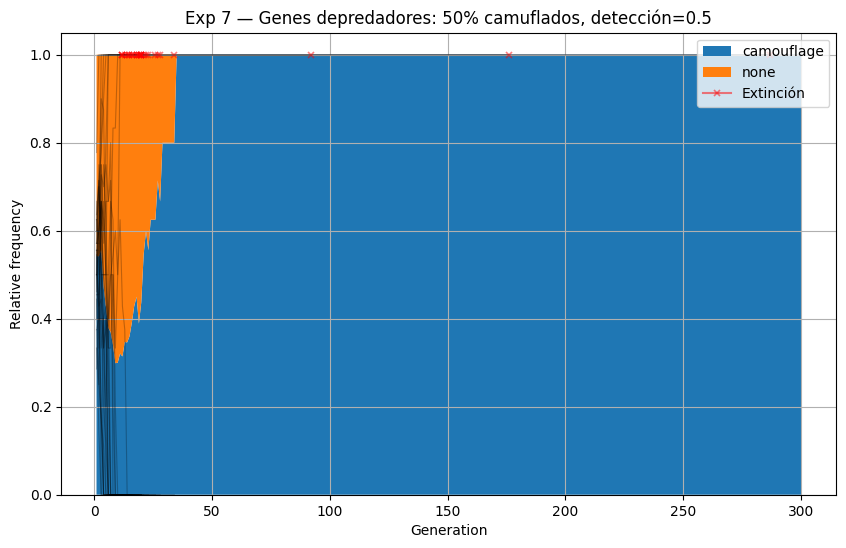

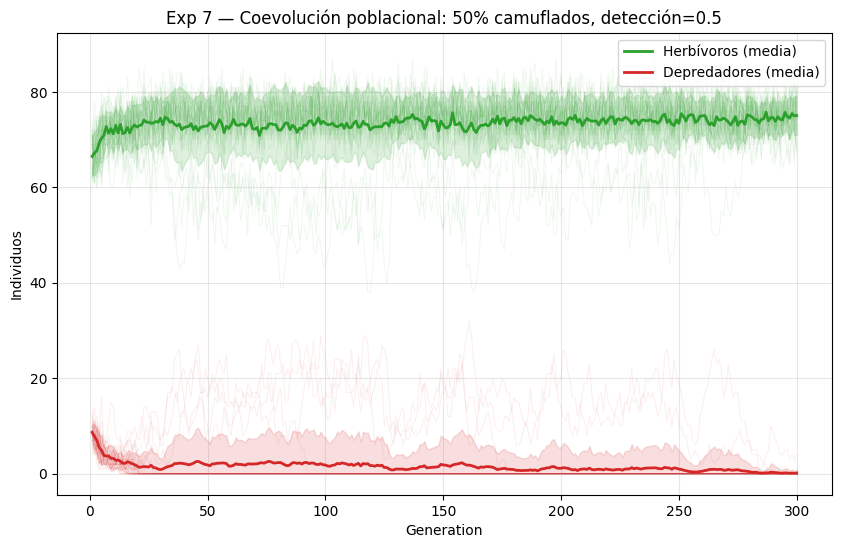

[50%, det=0.5] herb_fijado=30/30 | pred_fijado=1/30


In [13]:
# ── Combinación 3/6: frac_camo=50%, base_detection_prob=0.50 ─────────────────
frac_camo, base_detection_prob = 0.50, 0.50
frac_plain = 1.0 - frac_camo

herbivore_specs_exp7 = [
    (lambda: [CowardGene()],            frac_plain),
    (lambda: [CamouflageCowardGene()],  frac_camo),
]
predator_specs_exp7 = [
    (lambda: [],                          frac_plain),
    (lambda: [CamouflagePredatorGene()],  frac_camo),
]

config_exp7 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp7 = SimpleExperiment(
    name=f"Exp 7 — Coevolución ({frac_camo:.0%} inicial, detección={base_detection_prob})",
    description=(
        f"CamouflageCowardGene y CamouflagePredatorGene simultáneos. "
        f"Fracción inicial = {frac_camo:.0%}, base_detection_prob = {base_detection_prob}."
    ),
    config=config_exp7,
    herbivore_specs=herbivore_specs_exp7,
    predator_specs=predator_specs_exp7,
)

base_seed = 30_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
all_runs = run_multiple(exp7, config_exp7, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 7 — Genes herbívoros: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 7 — Genes depredadores: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 7 — Coevolución poblacional: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)

herb_fixed = sum(1 for run in all_runs if run[-1].gene_frequencies.get("camouflage_coward", 0.0) > 0.90)
pred_fixed = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90)
print(f"[{frac_camo:.0%}, det={base_detection_prob}] herb_fijado={herb_fixed}/30 | pred_fijado={pred_fixed}/30")

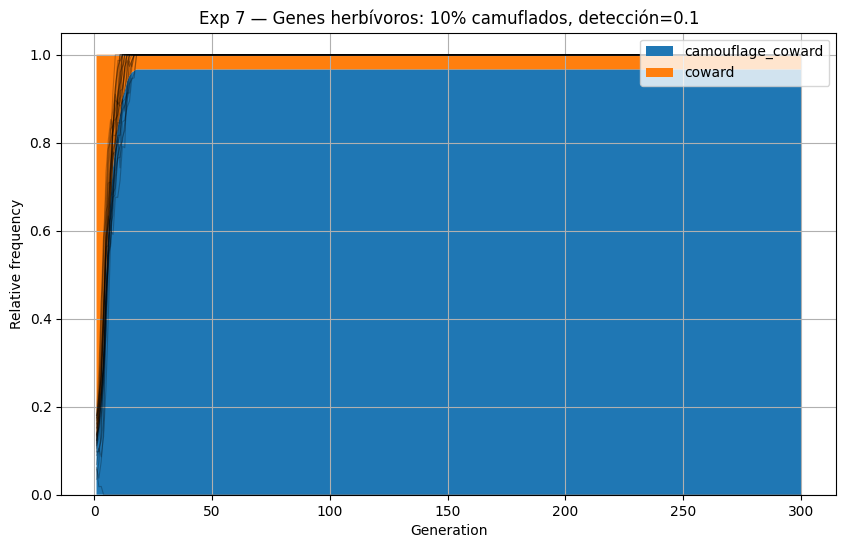

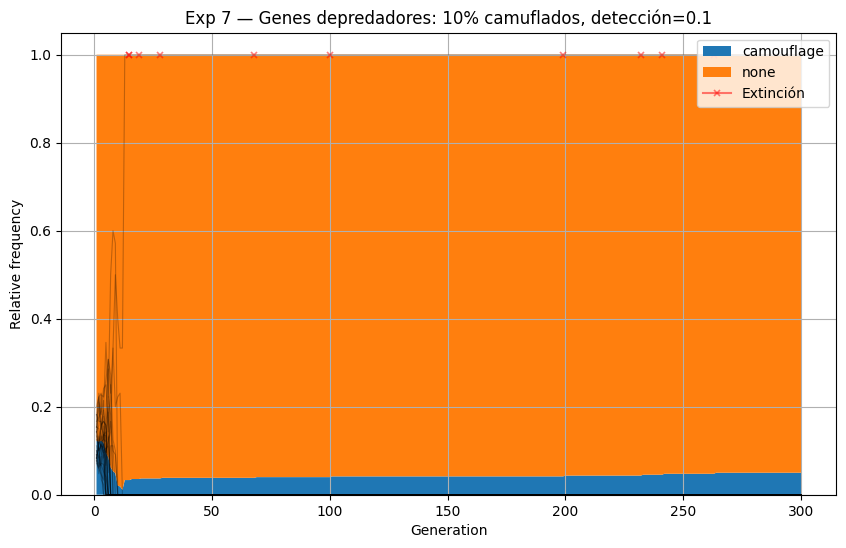

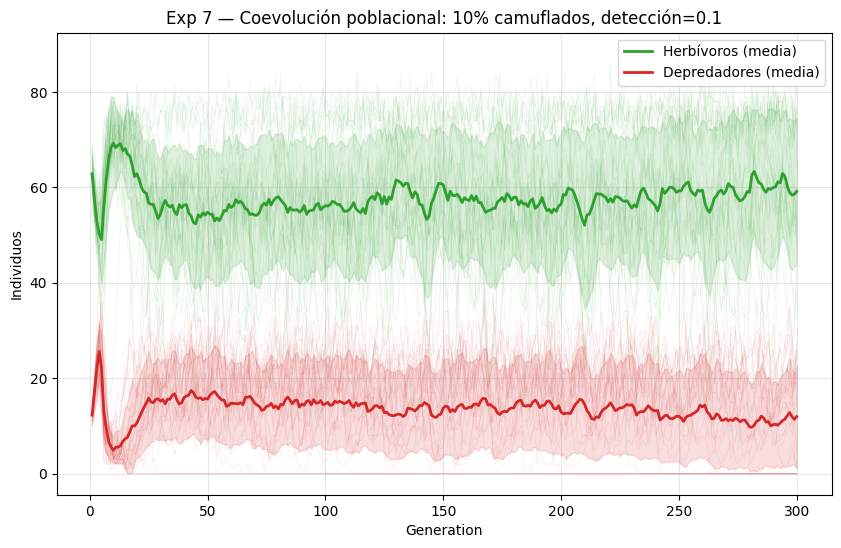

[10%, det=0.1] herb_fijado=29/30 | pred_fijado=1/30


In [14]:
# ── Combinación 4/6: frac_camo=10%, base_detection_prob=0.10 ─────────────────
frac_camo, base_detection_prob = 0.10, 0.10
frac_plain = 1.0 - frac_camo

herbivore_specs_exp7 = [
    (lambda: [CowardGene()],            frac_plain),
    (lambda: [CamouflageCowardGene()],  frac_camo),
]
predator_specs_exp7 = [
    (lambda: [],                          frac_plain),
    (lambda: [CamouflagePredatorGene()],  frac_camo),
]

config_exp7 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp7 = SimpleExperiment(
    name=f"Exp 7 — Coevolución ({frac_camo:.0%} inicial, detección={base_detection_prob})",
    description=(
        f"CamouflageCowardGene y CamouflagePredatorGene simultáneos. "
        f"Fracción inicial = {frac_camo:.0%}, base_detection_prob = {base_detection_prob}."
    ),
    config=config_exp7,
    herbivore_specs=herbivore_specs_exp7,
    predator_specs=predator_specs_exp7,
)

base_seed = 30_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
all_runs = run_multiple(exp7, config_exp7, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 7 — Genes herbívoros: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 7 — Genes depredadores: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 7 — Coevolución poblacional: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)

herb_fixed = sum(1 for run in all_runs if run[-1].gene_frequencies.get("camouflage_coward", 0.0) > 0.90)
pred_fixed = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90)
print(f"[{frac_camo:.0%}, det={base_detection_prob}] herb_fijado={herb_fixed}/30 | pred_fijado={pred_fixed}/30")

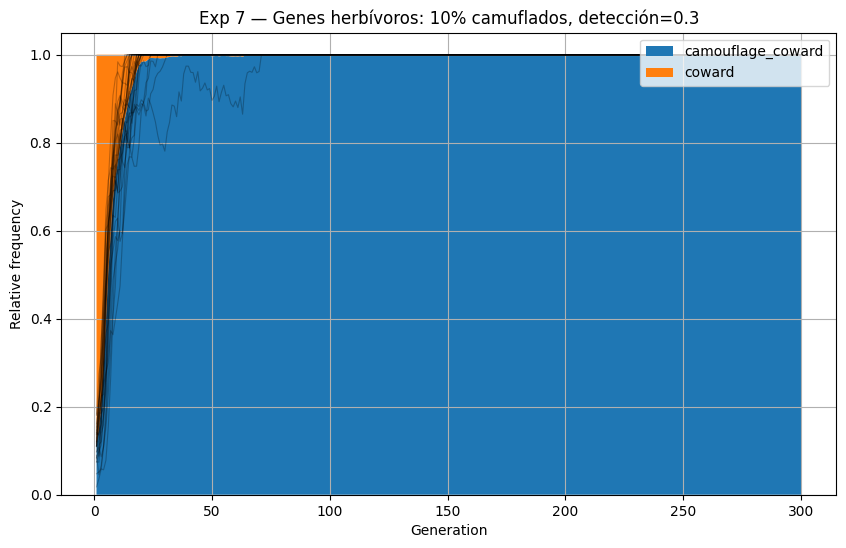

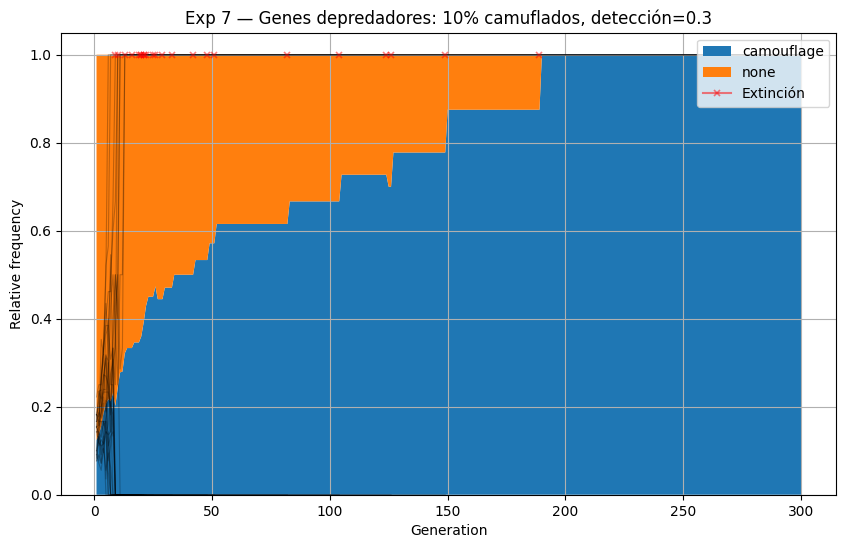

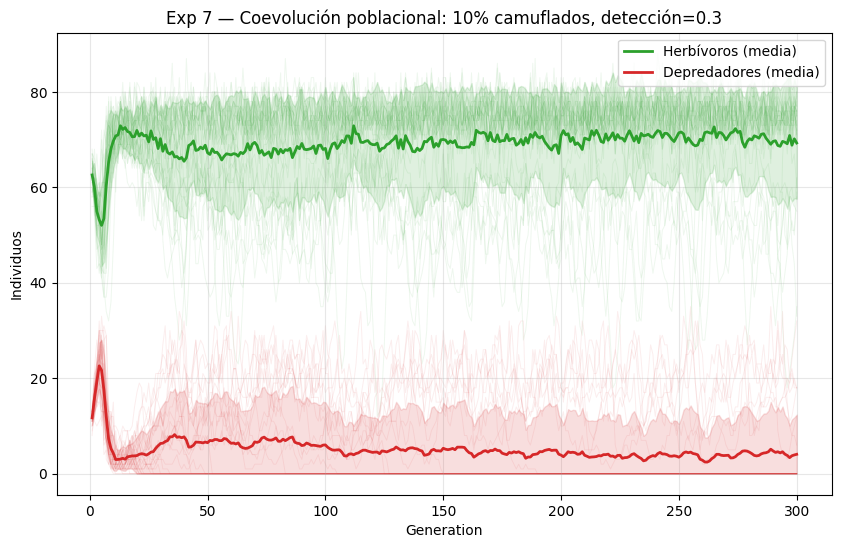

[10%, det=0.3] herb_fijado=30/30 | pred_fijado=7/30


In [15]:
# ── Combinación 5/6: frac_camo=10%, base_detection_prob=0.30 ─────────────────
frac_camo, base_detection_prob = 0.10, 0.30
frac_plain = 1.0 - frac_camo

herbivore_specs_exp7 = [
    (lambda: [CowardGene()],            frac_plain),
    (lambda: [CamouflageCowardGene()],  frac_camo),
]
predator_specs_exp7 = [
    (lambda: [],                          frac_plain),
    (lambda: [CamouflagePredatorGene()],  frac_camo),
]

config_exp7 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp7 = SimpleExperiment(
    name=f"Exp 7 — Coevolución ({frac_camo:.0%} inicial, detección={base_detection_prob})",
    description=(
        f"CamouflageCowardGene y CamouflagePredatorGene simultáneos. "
        f"Fracción inicial = {frac_camo:.0%}, base_detection_prob = {base_detection_prob}."
    ),
    config=config_exp7,
    herbivore_specs=herbivore_specs_exp7,
    predator_specs=predator_specs_exp7,
)

base_seed = 30_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
all_runs = run_multiple(exp7, config_exp7, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 7 — Genes herbívoros: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 7 — Genes depredadores: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 7 — Coevolución poblacional: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)

herb_fixed = sum(1 for run in all_runs if run[-1].gene_frequencies.get("camouflage_coward", 0.0) > 0.90)
pred_fixed = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90)
print(f"[{frac_camo:.0%}, det={base_detection_prob}] herb_fijado={herb_fixed}/30 | pred_fijado={pred_fixed}/30")

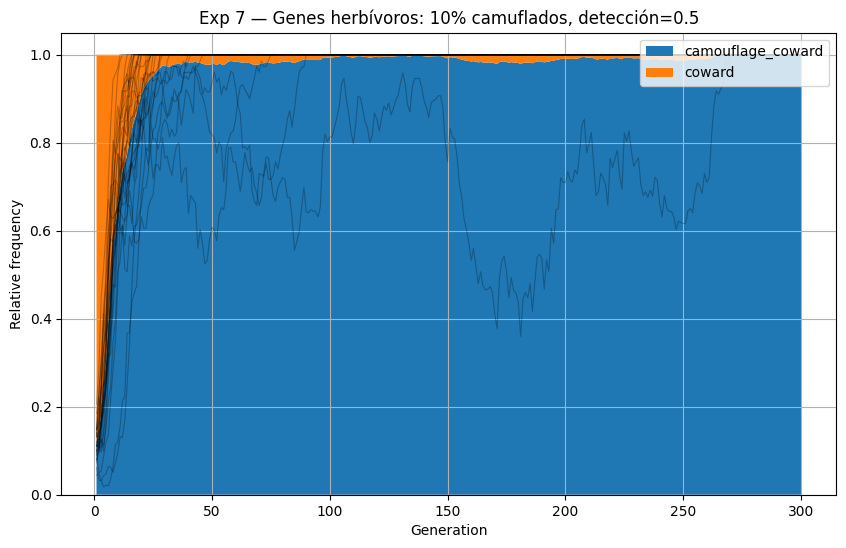

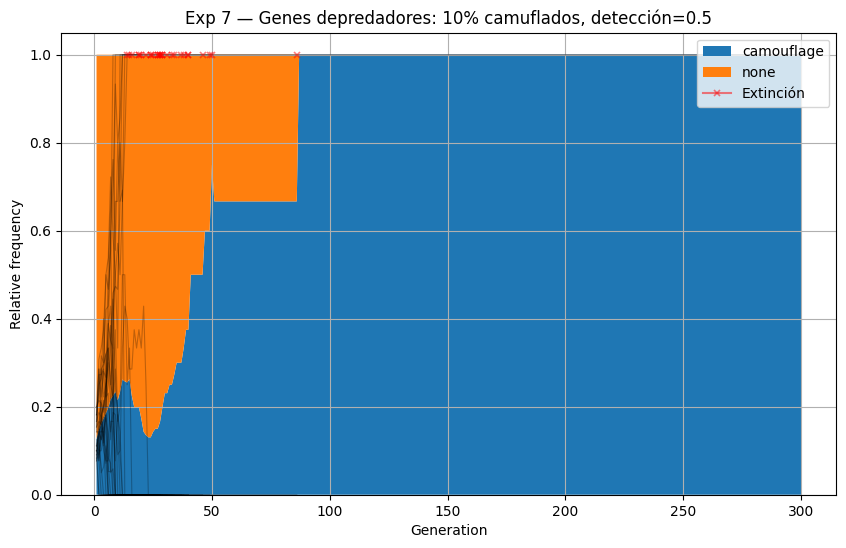

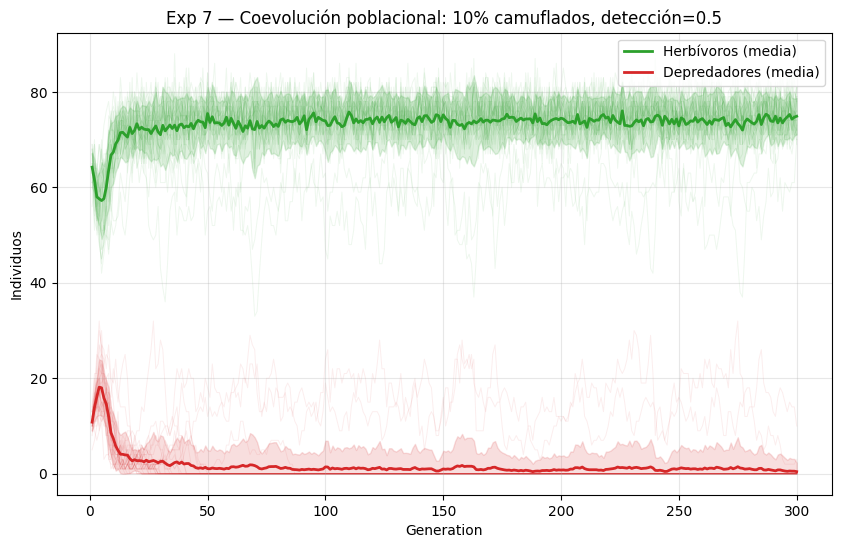

[10%, det=0.5] herb_fijado=30/30 | pred_fijado=2/30


In [16]:
# ── Combinación 6/6: frac_camo=10%, base_detection_prob=0.50 ─────────────────
frac_camo, base_detection_prob = 0.10, 0.50
frac_plain = 1.0 - frac_camo

herbivore_specs_exp7 = [
    (lambda: [CowardGene()],            frac_plain),
    (lambda: [CamouflageCowardGene()],  frac_camo),
]
predator_specs_exp7 = [
    (lambda: [],                          frac_plain),
    (lambda: [CamouflagePredatorGene()],  frac_camo),
]

config_exp7 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=2,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp7 = SimpleExperiment(
    name=f"Exp 7 — Coevolución ({frac_camo:.0%} inicial, detección={base_detection_prob})",
    description=(
        f"CamouflageCowardGene y CamouflagePredatorGene simultáneos. "
        f"Fracción inicial = {frac_camo:.0%}, base_detection_prob = {base_detection_prob}."
    ),
    config=config_exp7,
    herbivore_specs=herbivore_specs_exp7,
    predator_specs=predator_specs_exp7,
)

base_seed = 30_000 + int(frac_camo * 100) * 10 + int(base_detection_prob * 100)
all_runs = run_multiple(exp7, config_exp7, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 7 — Genes herbívoros: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 7 — Genes depredadores: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 7 — Coevolución poblacional: {frac_camo:.0%} camuflados, detección={base_detection_prob}",
    show=True,
)

herb_fixed = sum(1 for run in all_runs if run[-1].gene_frequencies.get("camouflage_coward", 0.0) > 0.90)
pred_fixed = sum(1 for run in all_runs if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90)
print(f"[{frac_camo:.0%}, det={base_detection_prob}] herb_fijado={herb_fixed}/30 | pred_fijado={pred_fixed}/30")

## Experimento 8 — Agrupamiento social con barba verde frente a depredadores camuflados

**Hipótesis**: los herbívoros portadores de `SocialGreenBeardAltruistGene` combinan tres ventajas simultáneas: (1) señal de barba verde que activa altruismo selectivo entre congéneres, (2) preferencia por árboles densamente ocupados que concentra el grupo y reduce el riesgo individual por dilución, y (3) comportamiento altruista que advierte a los portadores de la señal. Esta combinación debería contrarrestar la ventaja del camuflaje predador, que en experimentos anteriores llevó a los depredadores a su propia extinción por sobreexplotación. La pregunta central es: ¿bajo qué probabilidad de detección del camuflaje predador se alcanza un equilibrio poblacional estable donde ninguna de las dos especies se extingue sistemáticamente?

**Condición experimental**:
- **Herbívoros**: 50 % `CowardGene` / 50 % `SocialGreenBeardAltruistGene`
- **Depredadores**: 50 % sin genes (aleatorios) / 50 % `CamouflagePredatorGene`
- `tree_capacity_max=10` — árboles grandes para que el agrupamiento social sea viable
- `altruist_escape_prob=0.50`
- Barrido sobre `base_detection_prob` ∈ {0.10, 0.30, 0.50, 0.70, 0.90}: a menor detección, más ventaja el camuflaje predador; a mayor detección, los herbívoros agrupados detectan y avisan más

Se ejecutan 30 corridas de 300 generaciones por combinación.

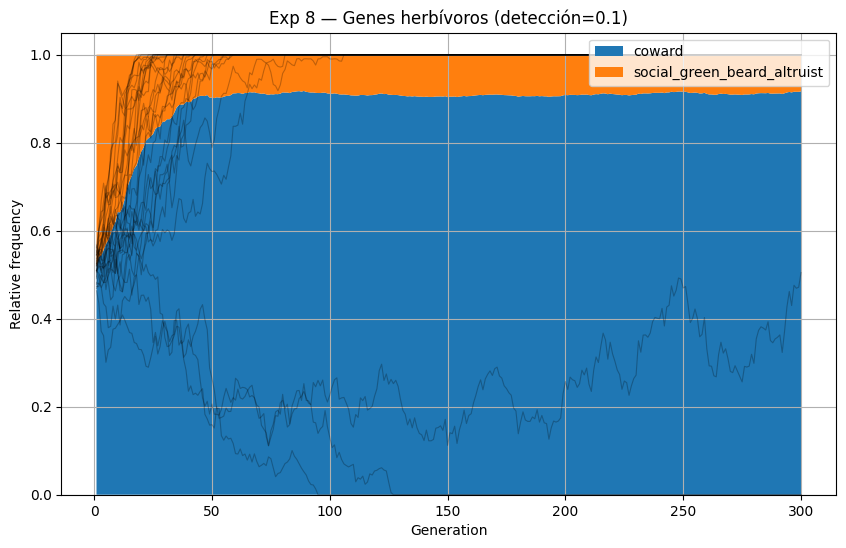

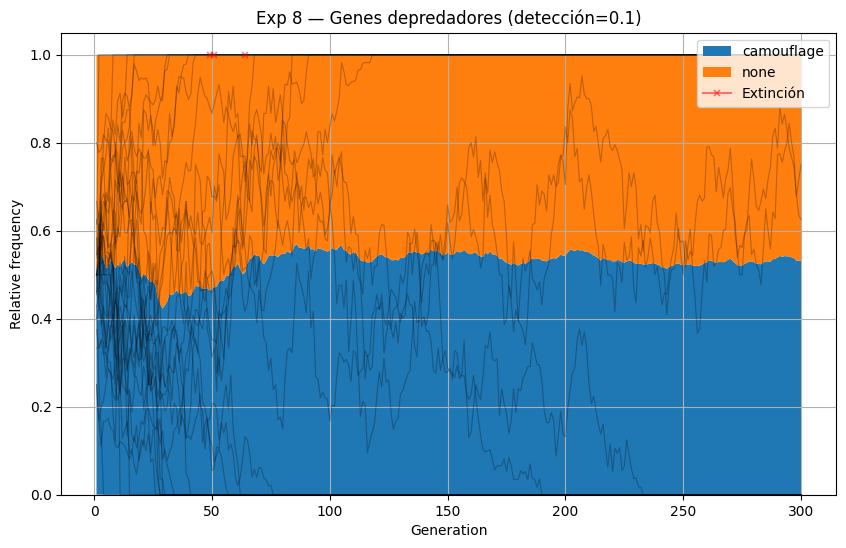

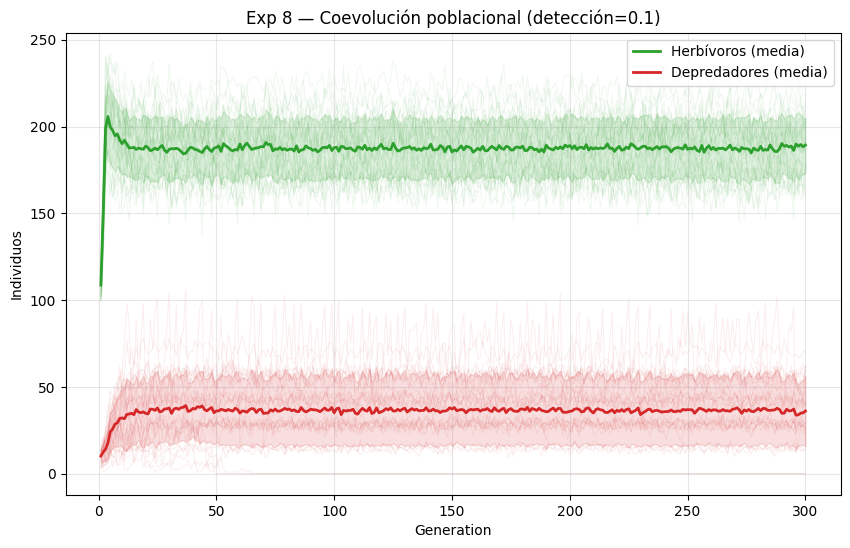

[det=0.1] herb_social_fijado=2/30 | pred_camo_fijado=13/30 | pred_extintos=3/30


In [17]:
# ── Combinación 1/5: base_detection_prob=0.10 ────────────────────────────────
base_detection_prob = 0.10

herbivore_specs_exp8 = [
    (lambda: [CowardGene()],                   0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp8 = [
    (lambda: [],                          0.50),
    (lambda: [CamouflagePredatorGene()],  0.50),
]

config_exp8 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp8 = SimpleExperiment(
    name=f"Exp 8 — Barba verde social vs camuflaje predador (detección={base_detection_prob})",
    description=(
        f"50% CowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% plain / 50% CamouflagePredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp8,
    herbivore_specs=herbivore_specs_exp8,
    predator_specs=predator_specs_exp8,
)

base_seed = 40_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp8, config_exp8, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 8 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 8 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 8 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_fixed = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
pred_fixed = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90
)
pred_extinct = sum(
    1 for run in all_runs
    if run[-1].predator_count_end == 0
)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_fixed}/30 | "
    f"pred_camo_fijado={pred_fixed}/30 | "
    f"pred_extintos={pred_extinct}/30"
)

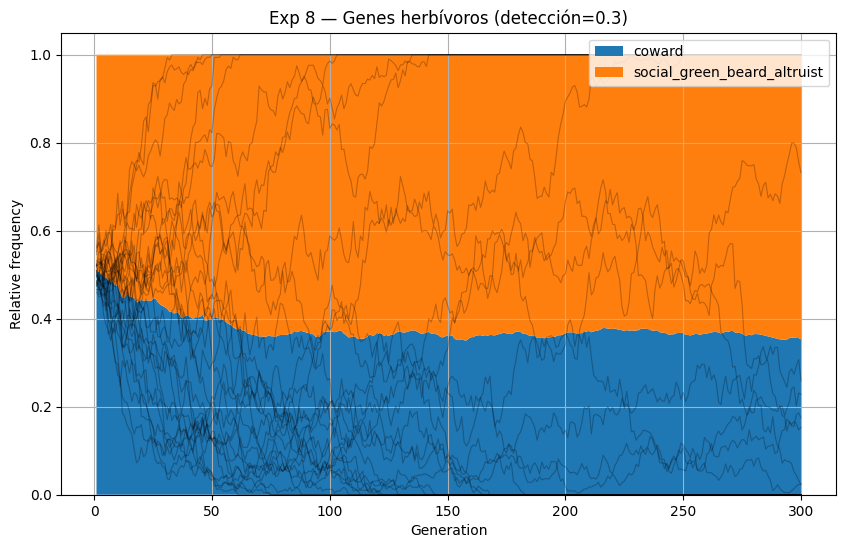

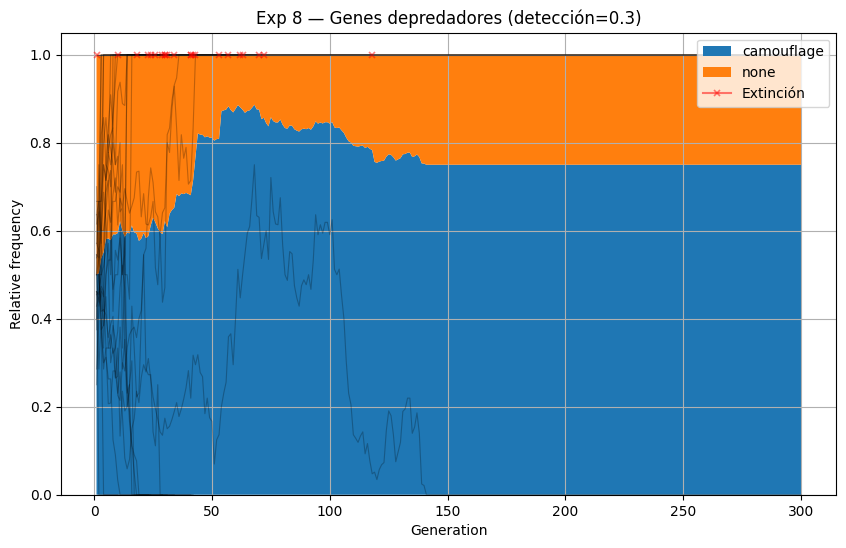

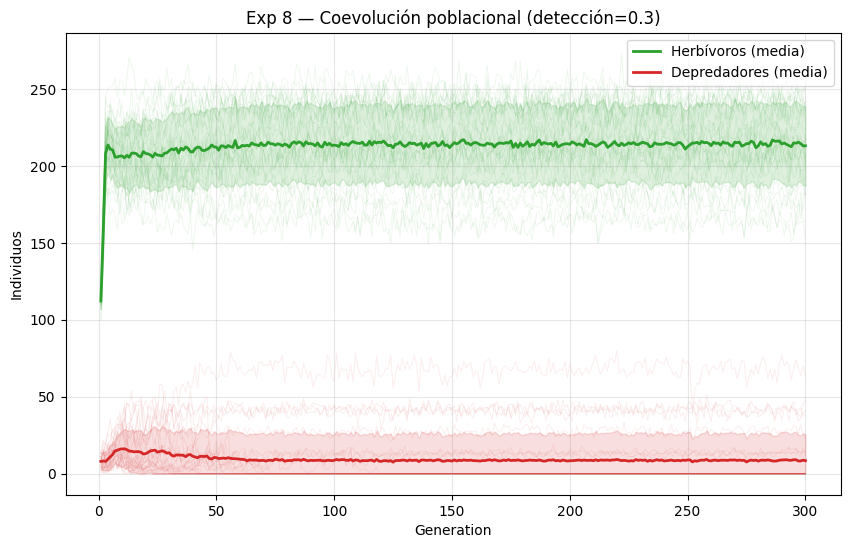

[det=0.3] herb_social_fijado=16/30 | pred_camo_fijado=6/30 | pred_extintos=22/30


In [18]:
# ── Combinación 2/5: base_detection_prob=0.30 ────────────────────────────────
base_detection_prob = 0.30

herbivore_specs_exp8 = [
    (lambda: [CowardGene()],                   0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp8 = [
    (lambda: [],                          0.50),
    (lambda: [CamouflagePredatorGene()],  0.50),
]

config_exp8 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp8 = SimpleExperiment(
    name=f"Exp 8 — Barba verde social vs camuflaje predador (detección={base_detection_prob})",
    description=(
        f"50% CowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% plain / 50% CamouflagePredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp8,
    herbivore_specs=herbivore_specs_exp8,
    predator_specs=predator_specs_exp8,
)

base_seed = 40_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp8, config_exp8, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 8 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 8 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 8 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_fixed = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
pred_fixed = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90
)
pred_extinct = sum(
    1 for run in all_runs
    if run[-1].predator_count_end == 0
)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_fixed}/30 | "
    f"pred_camo_fijado={pred_fixed}/30 | "
    f"pred_extintos={pred_extinct}/30"
)

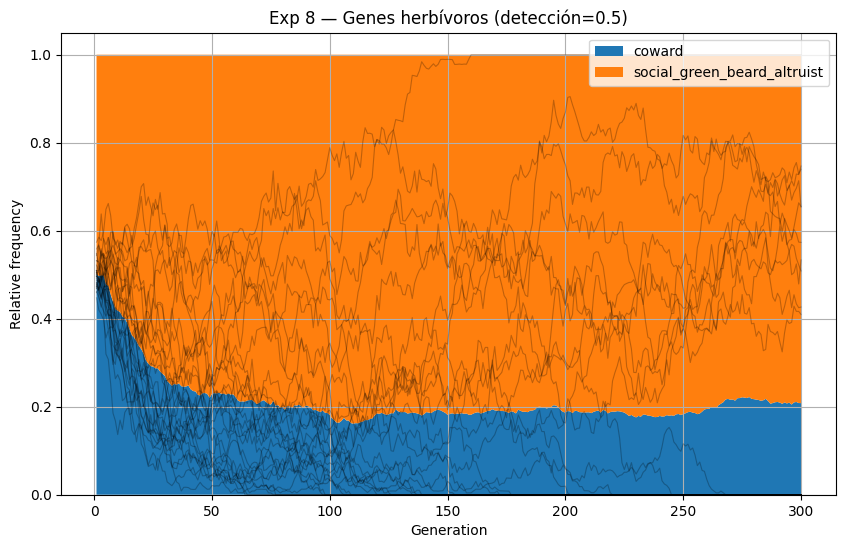

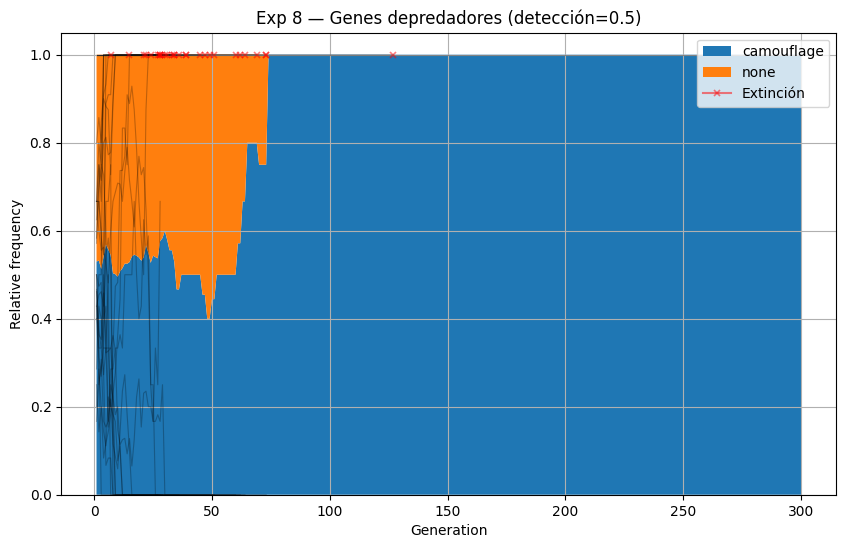

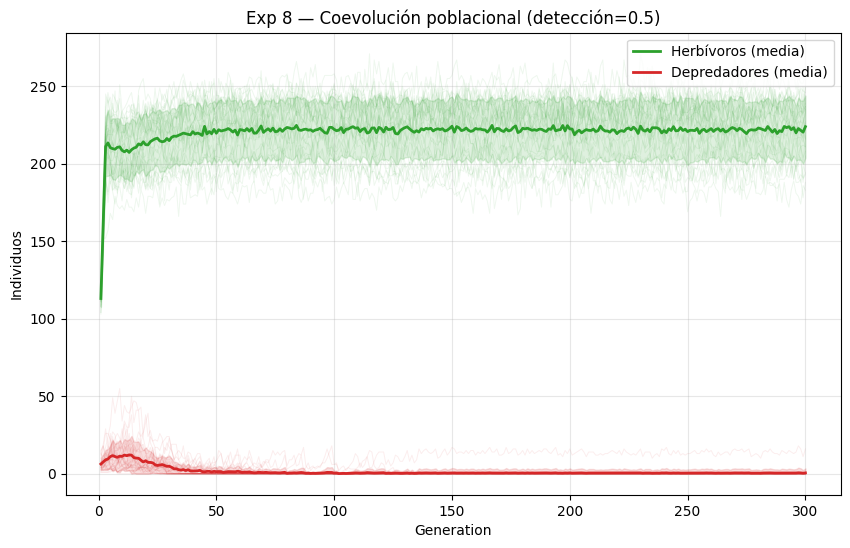

[det=0.5] herb_social_fijado=20/30 | pred_camo_fijado=1/30 | pred_extintos=29/30


In [19]:
# ── Combinación 3/5: base_detection_prob=0.50 ────────────────────────────────
base_detection_prob = 0.50

herbivore_specs_exp8 = [
    (lambda: [CowardGene()],                   0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp8 = [
    (lambda: [],                          0.50),
    (lambda: [CamouflagePredatorGene()],  0.50),
]

config_exp8 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp8 = SimpleExperiment(
    name=f"Exp 8 — Barba verde social vs camuflaje predador (detección={base_detection_prob})",
    description=(
        f"50% CowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% plain / 50% CamouflagePredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp8,
    herbivore_specs=herbivore_specs_exp8,
    predator_specs=predator_specs_exp8,
)

base_seed = 40_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp8, config_exp8, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 8 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 8 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 8 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_fixed = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
pred_fixed = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90
)
pred_extinct = sum(
    1 for run in all_runs
    if run[-1].predator_count_end == 0
)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_fixed}/30 | "
    f"pred_camo_fijado={pred_fixed}/30 | "
    f"pred_extintos={pred_extinct}/30"
)

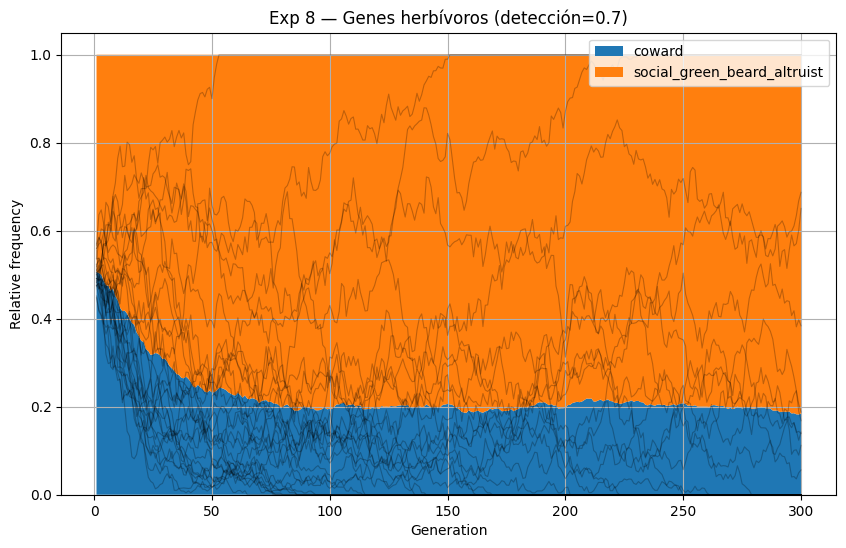

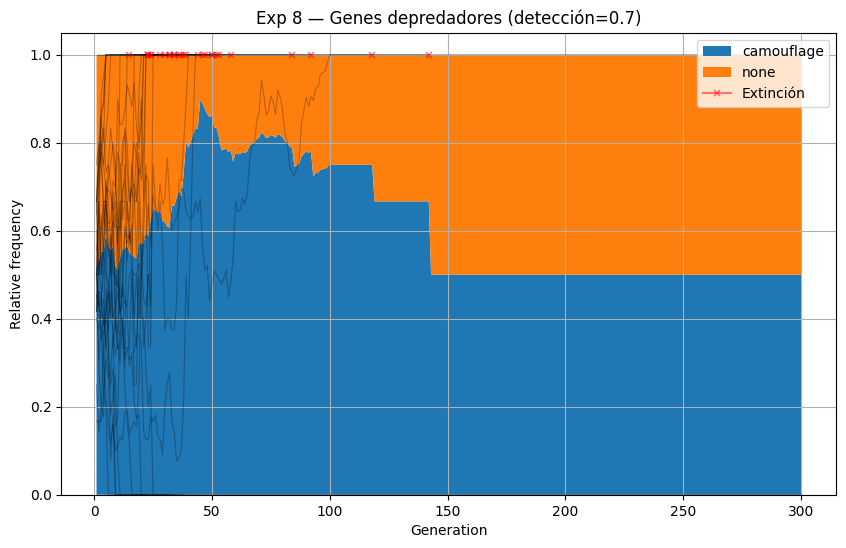

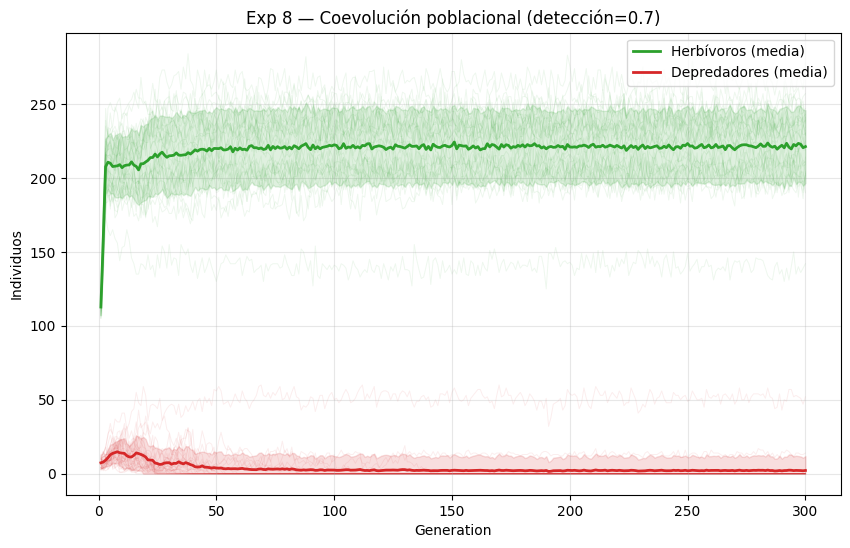

[det=0.7] herb_social_fijado=19/30 | pred_camo_fijado=1/30 | pred_extintos=28/30


In [20]:
# ── Combinación 4/5: base_detection_prob=0.70 ────────────────────────────────
base_detection_prob = 0.70

herbivore_specs_exp8 = [
    (lambda: [CowardGene()],                   0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp8 = [
    (lambda: [],                          0.50),
    (lambda: [CamouflagePredatorGene()],  0.50),
]

config_exp8 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp8 = SimpleExperiment(
    name=f"Exp 8 — Barba verde social vs camuflaje predador (detección={base_detection_prob})",
    description=(
        f"50% CowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% plain / 50% CamouflagePredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp8,
    herbivore_specs=herbivore_specs_exp8,
    predator_specs=predator_specs_exp8,
)

base_seed = 40_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp8, config_exp8, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 8 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 8 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 8 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_fixed = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
pred_fixed = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90
)
pred_extinct = sum(
    1 for run in all_runs
    if run[-1].predator_count_end == 0
)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_fixed}/30 | "
    f"pred_camo_fijado={pred_fixed}/30 | "
    f"pred_extintos={pred_extinct}/30"
)

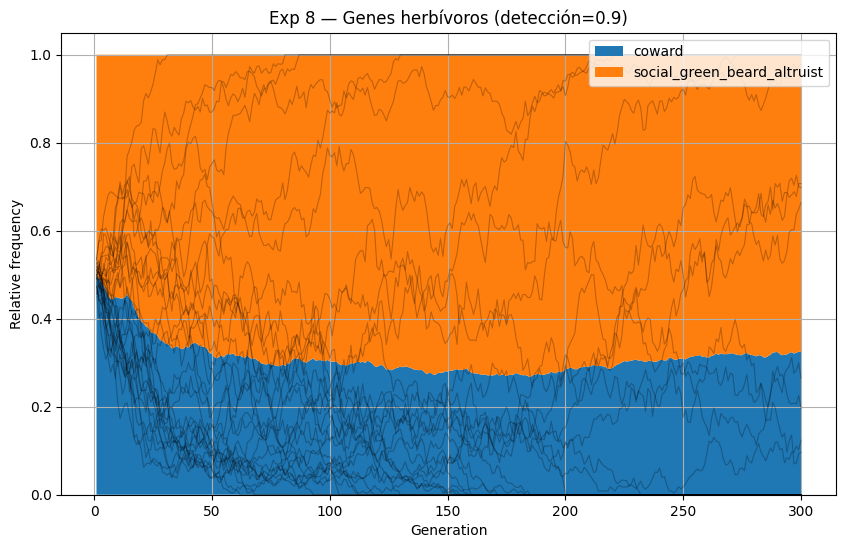

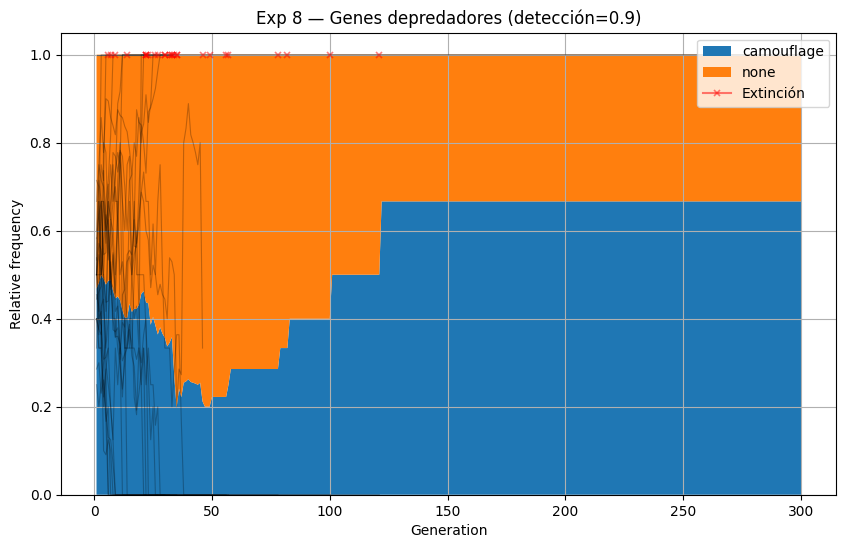

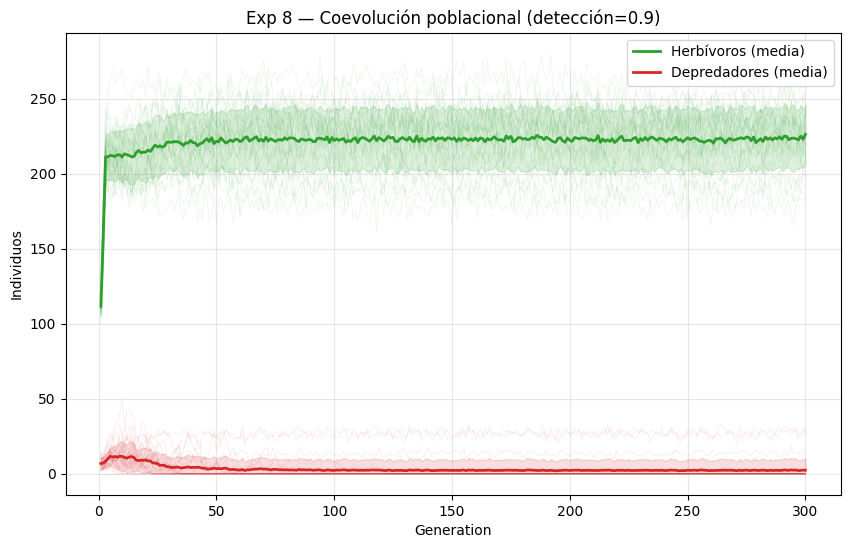

[det=0.9] herb_social_fijado=17/30 | pred_camo_fijado=2/30 | pred_extintos=27/30


In [21]:
# ── Combinación 5/5: base_detection_prob=0.90 ────────────────────────────────
base_detection_prob = 0.90

herbivore_specs_exp8 = [
    (lambda: [CowardGene()],                   0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp8 = [
    (lambda: [],                          0.50),
    (lambda: [CamouflagePredatorGene()],  0.50),
]

config_exp8 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp8 = SimpleExperiment(
    name=f"Exp 8 — Barba verde social vs camuflaje predador (detección={base_detection_prob})",
    description=(
        f"50% CowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% plain / 50% CamouflagePredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp8,
    herbivore_specs=herbivore_specs_exp8,
    predator_specs=predator_specs_exp8,
)

base_seed = 40_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp8, config_exp8, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 8 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 8 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 8 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_fixed = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
pred_fixed = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("camouflage", 0.0) > 0.90
)
pred_extinct = sum(
    1 for run in all_runs
    if run[-1].predator_count_end == 0
)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_fixed}/30 | "
    f"pred_camo_fijado={pred_fixed}/30 | "
    f"pred_extintos={pred_extinct}/30"
)

## Experimento 9 — Social vs. Solitario · Emboscador camuflado vs. Cazador cauteloso

**Motivación**: en el Experimento 8 los depredadores camuflados continuaron extinguiéndose incluso cuando los herbívoros podían agruparse con barba verde. Se introduce una nueva asimetría: los depredadores emboscadores (que buscan los árboles más poblados y, por tanto, se benefician directamente del agrupamiento de los herbívoros) poseen un camuflaje extremo del 90 %; los depredadores cautelosos (que buscan los árboles menos poblados para evitar ser detectados) no tienen camuflaje adicional.

Del lado de los herbívoros, la estrategia solitaria actúa como contrapunto directo a la social: los solitarios dispersan la población en árboles poco concurridos, lo que los protege de los emboscadores pero los expone a los cazadores cautelosos.

**Condición experimental**:
- **Herbívoros**: 50 % `SolitaryCowardGene` (solitario + cobarde) / 50 % `SocialGreenBeardAltruistGene` (social + barba verde + altruista)
- **Depredadores**: 50 % `AmbushCamoGene` (emboscada + camuflaje 90 %) / 50 % `CautiousPredatorGene` (árbol menos poblado, sin camuflaje extra)
- `tree_capacity_max=10` para que la dispersión solitaria sea efectiva
- Barrido sobre `base_detection_prob` ∈ {0.10, 0.30, 0.50, 0.70, 0.90}
- 30 corridas de 300 generaciones por combinación

In [ ]:
# ── Combinación 1/5: base_detection_prob=0.10 ────────────────────────────────
base_detection_prob = 0.10

herbivore_specs_exp9 = [
    (lambda: [SolitaryCowardGene()],           0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp9 = [
    (lambda: [AmbushCamoGene()],        0.50),
    (lambda: [CautiousPredatorGene()],  0.50),
]

config_exp9 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp9 = SimpleExperiment(
    name=f"Exp 9 — Social/Solitario vs Emboscador-Camo/Cauteloso (detección={base_detection_prob})",
    description=(
        f"50% SolitaryCowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% AmbushCamoGene / 50% CautiousPredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp9,
    herbivore_specs=herbivore_specs_exp9,
    predator_specs=predator_specs_exp9,
)

base_seed = 50_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp9, config_exp9, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 9 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 9 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 9 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_social = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
herb_solitary = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("solitary_coward", 0.0) > 0.90
)
pred_ambush = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("ambush_camo", 0.0) > 0.90
)
pred_cautious = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("cautious_predator", 0.0) > 0.90
)
pred_extinct = sum(1 for run in all_runs if run[-1].predator_count_end == 0)
herb_extinct = sum(1 for run in all_runs if run[-1].population_end == 0)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_social}/30 | herb_solitario_fijado={herb_solitary}/30 | "
    f"pred_emboscador_fijado={pred_ambush}/30 | pred_cauteloso_fijado={pred_cautious}/30 | "
    f"pred_extintos={pred_extinct}/30 | herb_extintos={herb_extinct}/30"
)

In [ ]:
# ── Combinación 2/5: base_detection_prob=0.30 ────────────────────────────────
base_detection_prob = 0.30

herbivore_specs_exp9 = [
    (lambda: [SolitaryCowardGene()],           0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp9 = [
    (lambda: [AmbushCamoGene()],        0.50),
    (lambda: [CautiousPredatorGene()],  0.50),
]

config_exp9 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp9 = SimpleExperiment(
    name=f"Exp 9 — Social/Solitario vs Emboscador-Camo/Cauteloso (detección={base_detection_prob})",
    description=(
        f"50% SolitaryCowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% AmbushCamoGene / 50% CautiousPredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp9,
    herbivore_specs=herbivore_specs_exp9,
    predator_specs=predator_specs_exp9,
)

base_seed = 50_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp9, config_exp9, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 9 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 9 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 9 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_social = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
herb_solitary = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("solitary_coward", 0.0) > 0.90
)
pred_ambush = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("ambush_camo", 0.0) > 0.90
)
pred_cautious = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("cautious_predator", 0.0) > 0.90
)
pred_extinct = sum(1 for run in all_runs if run[-1].predator_count_end == 0)
herb_extinct = sum(1 for run in all_runs if run[-1].population_end == 0)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_social}/30 | herb_solitario_fijado={herb_solitary}/30 | "
    f"pred_emboscador_fijado={pred_ambush}/30 | pred_cauteloso_fijado={pred_cautious}/30 | "
    f"pred_extintos={pred_extinct}/30 | herb_extintos={herb_extinct}/30"
)

In [ ]:
# ── Combinación 3/5: base_detection_prob=0.50 ────────────────────────────────
base_detection_prob = 0.50

herbivore_specs_exp9 = [
    (lambda: [SolitaryCowardGene()],           0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp9 = [
    (lambda: [AmbushCamoGene()],        0.50),
    (lambda: [CautiousPredatorGene()],  0.50),
]

config_exp9 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp9 = SimpleExperiment(
    name=f"Exp 9 — Social/Solitario vs Emboscador-Camo/Cauteloso (detección={base_detection_prob})",
    description=(
        f"50% SolitaryCowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% AmbushCamoGene / 50% CautiousPredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp9,
    herbivore_specs=herbivore_specs_exp9,
    predator_specs=predator_specs_exp9,
)

base_seed = 50_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp9, config_exp9, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 9 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 9 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 9 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_social = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
herb_solitary = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("solitary_coward", 0.0) > 0.90
)
pred_ambush = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("ambush_camo", 0.0) > 0.90
)
pred_cautious = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("cautious_predator", 0.0) > 0.90
)
pred_extinct = sum(1 for run in all_runs if run[-1].predator_count_end == 0)
herb_extinct = sum(1 for run in all_runs if run[-1].population_end == 0)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_social}/30 | herb_solitario_fijado={herb_solitary}/30 | "
    f"pred_emboscador_fijado={pred_ambush}/30 | pred_cauteloso_fijado={pred_cautious}/30 | "
    f"pred_extintos={pred_extinct}/30 | herb_extintos={herb_extinct}/30"
)

In [ ]:
# ── Combinación 4/5: base_detection_prob=0.70 ────────────────────────────────
base_detection_prob = 0.70

herbivore_specs_exp9 = [
    (lambda: [SolitaryCowardGene()],           0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp9 = [
    (lambda: [AmbushCamoGene()],        0.50),
    (lambda: [CautiousPredatorGene()],  0.50),
]

config_exp9 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp9 = SimpleExperiment(
    name=f"Exp 9 — Social/Solitario vs Emboscador-Camo/Cauteloso (detección={base_detection_prob})",
    description=(
        f"50% SolitaryCowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% AmbushCamoGene / 50% CautiousPredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp9,
    herbivore_specs=herbivore_specs_exp9,
    predator_specs=predator_specs_exp9,
)

base_seed = 50_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp9, config_exp9, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 9 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 9 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 9 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_social = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
herb_solitary = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("solitary_coward", 0.0) > 0.90
)
pred_ambush = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("ambush_camo", 0.0) > 0.90
)
pred_cautious = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("cautious_predator", 0.0) > 0.90
)
pred_extinct = sum(1 for run in all_runs if run[-1].predator_count_end == 0)
herb_extinct = sum(1 for run in all_runs if run[-1].population_end == 0)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_social}/30 | herb_solitario_fijado={herb_solitary}/30 | "
    f"pred_emboscador_fijado={pred_ambush}/30 | pred_cauteloso_fijado={pred_cautious}/30 | "
    f"pred_extintos={pred_extinct}/30 | herb_extintos={herb_extinct}/30"
)

In [ ]:
# ── Combinación 5/5: base_detection_prob=0.90 ────────────────────────────────
base_detection_prob = 0.90

herbivore_specs_exp9 = [
    (lambda: [SolitaryCowardGene()],           0.50),
    (lambda: [SocialGreenBeardAltruistGene()], 0.50),
]
predator_specs_exp9 = [
    (lambda: [AmbushCamoGene()],        0.50),
    (lambda: [CautiousPredatorGene()],  0.50),
]

config_exp9 = SimulationConfig(
    num_trees=25,
    tree_capacity_min=2,
    tree_capacity_max=10,
    num_generations=300,
    initial_population=80,
    initial_predators=8,
    offspring_min=1,
    offspring_max=2,
    predator_offspring_min=1,
    predator_offspring_max=2,
    base_detection_prob=base_detection_prob,
    altruist_escape_prob=0.50,
    predator_hunt_capacity=1,
    seed=0,
)

exp9 = SimpleExperiment(
    name=f"Exp 9 — Social/Solitario vs Emboscador-Camo/Cauteloso (detección={base_detection_prob})",
    description=(
        f"50% SolitaryCowardGene / 50% SocialGreenBeardAltruistGene contra "
        f"50% AmbushCamoGene / 50% CautiousPredatorGene. "
        f"tree_capacity_max=10, base_detection_prob={base_detection_prob}."
    ),
    config=config_exp9,
    herbivore_specs=herbivore_specs_exp9,
    predator_specs=predator_specs_exp9,
)

base_seed = 50_000 + int(base_detection_prob * 100)
all_runs = run_multiple(exp9, config_exp9, n_runs=30, base_seed=base_seed)

plot_aggregated_gene_distribution(
    all_runs,
    title=f"Exp 9 — Genes herbívoros (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_predator_gene_evolution(
    all_runs,
    title=f"Exp 9 — Genes depredadores (detección={base_detection_prob})",
    show=True,
)
plot_aggregated_coevolution(
    all_runs,
    title=f"Exp 9 — Coevolución poblacional (detección={base_detection_prob})",
    show=True,
)

herb_social = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("social_green_beard_altruist", 0.0) > 0.90
)
herb_solitary = sum(
    1 for run in all_runs
    if run[-1].gene_frequencies.get("solitary_coward", 0.0) > 0.90
)
pred_ambush = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("ambush_camo", 0.0) > 0.90
)
pred_cautious = sum(
    1 for run in all_runs
    if run[-1].predator_gene_frequencies.get("cautious_predator", 0.0) > 0.90
)
pred_extinct = sum(1 for run in all_runs if run[-1].predator_count_end == 0)
herb_extinct = sum(1 for run in all_runs if run[-1].population_end == 0)
print(
    f"[det={base_detection_prob}] "
    f"herb_social_fijado={herb_social}/30 | herb_solitario_fijado={herb_solitary}/30 | "
    f"pred_emboscador_fijado={pred_ambush}/30 | pred_cauteloso_fijado={pred_cautious}/30 | "
    f"pred_extintos={pred_extinct}/30 | herb_extintos={herb_extinct}/30"
)

## Conclusiones

Los experimentos documentados en este cuaderno permiten evaluar el rol evolutivo de distintos mecanismos de defensa bajo presión de depredación. Las observaciones más relevantes son las siguientes:

1. **Cobardía pura (Exp. 1)**: establece la dinámica de referencia. La población se estabiliza en función de la capacidad del entorno y la presión de depredación sin interacciones cooperativas.

2. **Cobardía vs Altruismo puro (Exp. 2)**: la ventaja selectiva del altruismo depende críticamente de `altruist_escape_prob`. Con p = 0.50 el coste individual puede igualar o superar el beneficio colectivo; con p = 0.90 el altruismo debería exhibir una ventaja sostenida, verificable estadísticamente a través de múltiples corridas.

3. **Altruismo selectivo con señal de barba verde (Exp. 3)**: la señal de barba verde restringe el altruismo a los portadores, reduciendo el problema del parásito social. La estabilidad del rasgo varía con la fracción inicial de portadores y la probabilidad de escape.

4. **Cuatro estrategias desacopladas (Exp. 4)**: la separación entre la señal y el comportamiento cooperativo introduce la posibilidad de explotación por parte de los impostores. La competencia resultante expone la fragilidad de los sistemas de señalización cuando la señal no está ligada al coste del altruismo.

5. **Camuflaje en herbívoros (Exp. 5)**: el doble efecto del camuflaje (invisibilidad + evasión) confiere una ventaja directa e inmediata que debería llevar a la fijación del rasgo, con una velocidad dependiente de la presión de detección.

6. **Camuflaje en depredadores (Exp. 6)**: la reducción de la probabilidad de detección favorece a los depredadores camuflados, lo que presiona a la baja la supervivencia de los herbívoros y puede desencadenar una carrera armamentista si se combina con el experimento siguiente.

7. **Coevolución del camuflaje (Exp. 7)**: la introducción simultánea de camuflaje en ambas especies genera dinámicas recíprocas que pueden producir equilibrios inestables o ciclos de coevolución, dependiendo de los valores paramétricos.

8. **Agrupamiento social con barba verde vs. camuflaje predador (Exp. 8)**: el gen `SocialGreenBeardAltruistGene` combina señalización de barba verde, altruismo selectivo y preferencia por árboles densamente ocupados. El barrido sobre `base_detection_prob` permite identificar el umbral de detección a partir del cual el agrupamiento social compensa suficientemente el camuflaje predador para mantener el equilibrio entre poblaciones sin extinción sistemática de ninguna de las dos especies.

9. **Social vs. Solitario · Emboscador camuflado vs. Cazador cauteloso (Exp. 9)**: se introduce una asimetría estratégica explícita entre depredadores. Los emboscadores (`AmbushCamoGene`) explotan directamente el agrupamiento de los herbívoros sociales con un camuflaje extremo del 90 %; los cautelosos (`CautiousPredatorGene`) se dirigen a los árboles menos poblados, presionando a los solitarios. La pregunta central es si la coexistencia de dos nichos depredadores especializados, uno para cada nicho de presa, permite mantener un equilibrio más estable que los experimentos anteriores, y bajo qué niveles de detección el camuflaje extremo deja de ser una ventaja suicida.

---

*Los resultados cuantitativos definitivos requieren la ejecución completa de las celdas. El tiempo de cómputo depende del número de corridas y generaciones configuradas en cada experimento.*